
<center>
<img src="https://drive.google.com/uc?id=1GkjZ9W02VQp4w4a4wA70NwRxDcwJJjWd" width="250" height="250" allow="autoplay"></img>


# <center> Deep Learning based Low Light Image Enhancement for Advanced Driver Assistance Systems <center/>
$ 
\fbox{
$ \scriptsize
Sunaina\  Saxena \\
\scriptsize
Department\ of\ Electerical\ Engineering\\
\scriptsize
IIT\ Bombay \\
\scriptsize
213070001@iitb.ac.in
$
} \ \ \ \ \ 
\fbox{   
$\scriptsize
Nihar\ Mahesh\  Gupte \\
\scriptsize
Department\ of\ Electerical\ Engineering\\
\scriptsize
IIT\ Bombay \\
\scriptsize
213070002@iitb.ac.in
$
} \ \ \ \ \ 
\fbox{   
$\scriptsize
Harsh\  Diwakar \\
\scriptsize
Department\ of\ Electerical\ Engineering\\
\scriptsize
IIT\ Bombay \\
\scriptsize
213070018@iitb.ac.in
$
} \ \ \ \ \ 
\fbox{   
$\scriptsize
Mohit\ Kumar\ Meena \\
\scriptsize
Department\ of\ Electerical\ Engineering\\
\scriptsize
IIT\ Bombay \\
\scriptsize
213070021@iitb.ac.in
$
} 
$
<center/>


In this notebook, Different techniques are explored for Low Light Image Enhancement for advanced driver assistance system. 

## Outline
- [1. Dataset](#1)
  - [1.1 BDD100K Dataset](#1.1)
  - [1.2 Pipeline for generation of low light image](#1.2)
  - [1.3 Dataset Modified Data Generation Pipeline](#1.3)
  - [1.3 TensorFlow Data pipeline](#1.3)
- [2. Histogram based Methods](#2)
 - [2.1 CLAHE](#2.1)
 - [2.2 Retinex Based Methods](#2.2)
    * [2.2.1 Single  scale  retinex  (SSR)](#2.2.1)
    * [2.2.2 Multi  scale  retinex  (MSR)](#2.2.2)
    * [2.2.3 Multi scale retinex with colour restoration (MSRCR)](#2.2.3)
    * [2.2.4. Multi scale retinex with colour preservation(MSRCP)](#2.2.4)
-[3. Learning based Algorithm](#3)
 - [3.1 Fast IP Net](#3.1)
 - [3.2 U-Net](#3.2)
  * [3.2.1 Model-1](#3.2.1)
  * [3.2.2 Model-2](#3.2.2)
  * [3.2.3 Model-3](#3.2.3)
 - [3.3 pix2pix](#3.3)
    * [3.3.1 Generator](#3.3.1)
    * [3.3.2 Discriminator](#3.3.2)
    * [3.3.3 Optimizers and Checkpoint Saver](#3.3.3)
 - [3.4 VGG16 + Residual Network](#3.4)
- [4. Results](#4)


##Packages
Following Packages will be used in this notebook-
- TensorFlow
- Keras
- PIL
- Numpy
- Pandas
- os
- cv2
- skimage
- random
- glob

## Import Packages and Mount Drive

In [ ]:
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import skimage.io
import skimage.transform
import random
from skimage.exposure import match_histograms
from skimage.exposure import adjust_gamma
from skimage.exposure import adjust_sigmoid
from skimage.exposure import equalize_hist 
import tensorflow as tf
import pathlib
import time
import datetime
from IPython import display
import warnings
from tensorflow.python.ops.numpy_ops import np_config
from glob import glob
from PIL import Image
from tensorflow.keras.layers import (
    Activation,
    Conv2D,
    Conv2DTranspose,
    MaxPooling2D,
    UpSampling2D,
    LeakyReLU,
    BatchNormalization,
    Dropout,
    Concatenate,
    concatenate,
    ZeroPadding2D
)

np_config.enable_numpy_behavior()
warnings.filterwarnings("ignore")

import warnings

warnings.filterwarnings("ignore")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


<a name="1"></a>
# 1 Dataset






<a name="1.1"></a>
## 1.1 BDD100K
[BDD100K: A Diverse Driving Dataset for Heterogeneous Multitask Learning](https://arxiv.org/abs/1805.04687) dataset is the largest and diverse driving video dataset. We have used the daytime extracted images as the ground truth and used a novel generation method to attain low-light method as described by Guofa Li et. al. in [A deep learning based image enhancement approach for autonomous driving at night](https://www.sciencedirect.com/science/article/pii/S0950705120307462?casa_token=pXWJAXaXBU0AAAAA:0ru1QbO_GR_FRzDhwl9A09-Y-Hieb62ieYGnT-NKiBrkZM8FtzL6Fa9kBT3xXl3HL-oMRa9gUg). Then we noticed that the image generated are more dark and not related to original night images, so we have modified the data generation pipeline to generate more real looking night images [here](#1.3)


<a name="1.2"></a>
## 1.2 Pipeline for generation of low light image

In this section we created a low light data generation pipeline from BDD100K dataset exactly as described by Guofa Li et. al. in [A deep learning based image enhancement approach for autonomous driving at night](https://www.sciencedirect.com/science/article/pii/S0950705120307462?casa_token=pXWJAXaXBU0AAAAA:0ru1QbO_GR_FRzDhwl9A09-Y-Hieb62ieYGnT-NKiBrkZM8FtzL6Fa9kBT3xXl3HL-oMRa9gUg)

In [ ]:
reference_image_folder = r"/content/drive/Shareddrives/EE610_Project/Data/Reference"

reference_image_list = os.listdir(reference_image_folder)

template = np.zeros((720,1280,3))

for ref_img in reference_image_list:


  img = skimage.io.imread(reference_image_folder+"/"+ref_img)
  img = skimage.transform.resize(img,(720,1280,3))
  template = template + img 

template = template / len(reference_image_list) 
Template = np.round((255*template)).astype(np.uint8)

A peak at the reference template image. This is nothing but the statistical average of all the reference images we used initially. 

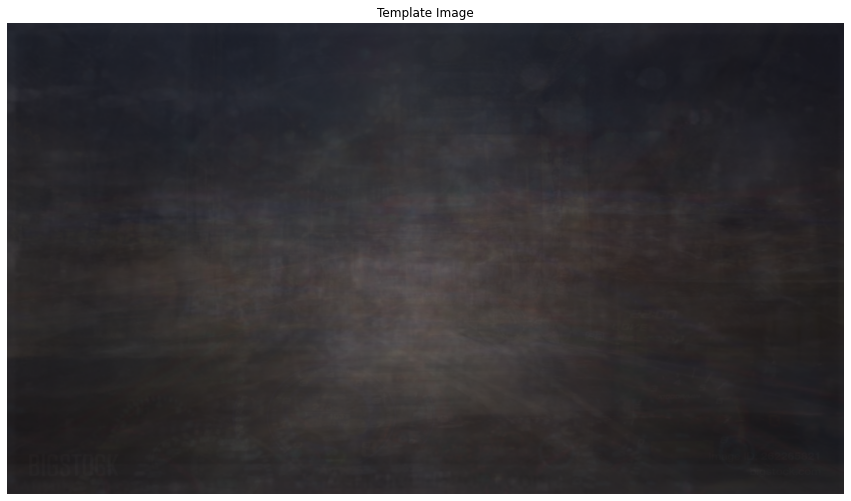

In [ ]:
plt.figure(figsize=(15,15))
plt.title("Template Image")
plt.imshow(Template)
plt.axis("off")
plt.show()

Now applying Gamma Alpha Beta transformations where beta is for histogram matching, gamma is for gamma correction, alpha is for contrast adjustment.

$γ \in Uniform[1,4]$ 

$β \in Uniform[0.1,1]$

$α \in Uniform[0.7,1]$

$β$ is used as a multiplier of reference image, now histogram of the image multiplied with $\beta$ is obtained.

$γ$ is used for the Gamma Transform.

$\alpha$ is used as a multiplier for finally obtained image to lower the overall brightness of the image.

In [ ]:
folder_path = r"/content/drive/Shareddrives/EE610_Project/Data"
Image_list = os.listdir(folder_path+"/train")
if len(os.listdir(folder_path+"/Degraded_Images"))>=7009:
  print("Degraded Images already exist")
else:
  for image in Image_list:
      image_path = folder_path + "/train/" +  image
      Clean_image = skimage.io.imread(image_path)
      
      Gamma = float(random.uniform(1,4))
      Alpha = random.uniform(0.1,1)
      Beta = random.uniform(0.7,1)
      Beta_Template = (Beta*Template)

      Degraded_image = match_histograms(Clean_image,Beta_Template,multichannel=True)
      Degraded_image = np.round(Alpha*adjust_gamma(Degraded_image,gamma = 1)).astype(np.uint8)
      Degraded_image = skimage.util.img_as_ubyte(Degraded_image)
      skimage.io.imsave(folder_path+"/Degraded_Images/"+image,arr=Degraded_image)

Degraded Images already exist


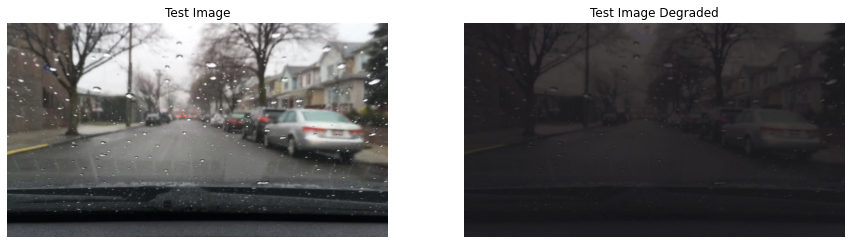

In [ ]:
test_image = skimage.io.imread(r"/content/drive/Shareddrives/EE610_Project/Data/train/b001a7ce-5cbc6e0b.jpg")
test_image_degraded = skimage.io.imread(r"/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images/b001a7ce-5cbc6e0b.jpg")
fig = plt.figure(figsize=(15,15))
fig.add_subplot(1,2,1)
plt.title("Test Image")
plt.imshow(test_image)
plt.axis("off")

fig.add_subplot(1,2,2)
plt.title("Test Image Degraded")
plt.imshow(test_image_degraded)
plt.axis("off")
plt.show()

As we can see, convincing results were not obtained using this method,they seemed like less bright version of the original images, hence we used a slightly different approach mentioned in the following section.

<a name="1.3"></a>
## 1.3 Dataset Modified Data Generation Pipeline

Firstly, we define a new directory to store degraded images.

In [ ]:
new_folder_path = r"/content/drive/Shareddrives/EE610_Project/" + "Degraded_Images_new"

try:
  os.mkdir(new_folder_path)
  print("Directory to store degraded image created")
except:
  print("A directory already exists to store degraded image")

Directory to store degraded image created


Rather than using plain Gamma transform and reducing the brightness, we chose the approach of histogram matching. For this, we chose 11 reference images, and then use their histograms so that more realistic night images can be obtained.

In [ ]:
reference_image_folder = r"/content/drive/Shareddrives/EE610_Project/New_references"

reference_image_list = os.listdir(reference_image_folder)

print("Number of Images in reference : ",len(reference_image_list))

Number of Images in reference :  11


In [ ]:
for i in reference_image_list:
  path = reference_image_folder + "/" + i  
  timg = skimage.io.imread(path)
  if (len(timg.shape)!=3):
    print("Invalid")

Let's check the effect of each reference image when matched to a particular image from our train dataset.

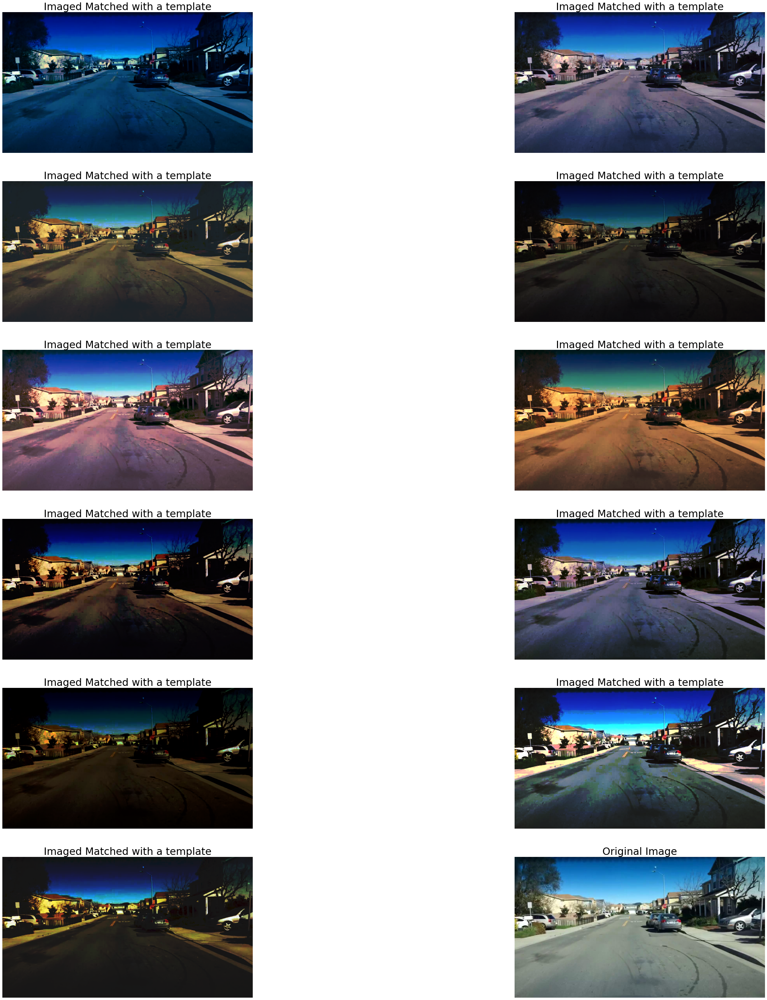

In [ ]:
testing_image = skimage.io.imread(r"/content/drive/Shareddrives/EE610_Project/train/0a1b45df-3afb5092.jpg")
figure = plt.figure(figsize=(50,100))

count = 1

for i in reference_image_list:
  template_path = r"/content/drive/Shareddrives/EE610_Project/New_references/" + i
  template_image = skimage.io.imread(template_path)
  output_img = match_histograms(testing_image,template_image,multichannel=True).astype(np.uint8)

  figure.add_subplot(len(reference_image_list),2,count)
  plt.title("Imaged Matched with a template",fontsize = 30)
  plt.imshow(output_img)
  plt.axis("off")
  count = count + 1

figure.add_subplot(len(reference_image_list),2,12)
plt.title("Original Image",fontsize = 30)
plt.imshow(testing_image)
plt.axis("off")
plt.show()

Now applying Gamma Alpha Beta transformations where beta is for histogram matching, gamma is for gamma correction, alpha is for contrast adjustment.

$γ \in Uniform[1,1.4]$ 

$β \in Uniform[0.8,1]$

$α \in Uniform[0.8,1]$

$β$ is used as a multiplier of reference image, now histogram of the image multiplied with $\beta$ is obtained.

$γ$ is used for the Gamma Transform.

$\alpha$ is used as a multiplier for finally obtained image to lower the overall brightness of the image.

In [ ]:
folder_path = r"/content/drive/Shareddrives/EE610_Project"
Image_list = os.listdir(folder_path+"/train")
i = 0

for image in Image_list:

    if(i%500 == 0):
      print("Images degraded : ",i)
    
    i = i+1

    image_path = folder_path + "/train/" +  image
    Clean_image = skimage.io.imread(image_path)
    
    Gamma = float(random.uniform(1,1.4))
    Alpha = random.uniform(0.8,1)
    Beta = random.uniform(0.8,1)

    Template_selector = random.randint(0,len(reference_image_list)-1)
    Template_path = reference_image_folder + "/" + str(reference_image_list[Template_selector])

    Template = skimage.io.imread(Template_path)
    
    Beta_Template = (Beta*Template)

    Degraded_image = match_histograms(Clean_image,Beta_Template,multichannel=True)
    Degraded_image = np.round(Alpha*adjust_gamma(Degraded_image,gamma = Gamma)).astype(np.uint8)
    Degraded_image = skimage.util.img_as_ubyte(Degraded_image)
    skimage.io.imsave(folder_path+"/Degraded_Images_new/"+image,arr=Degraded_image) 


Images degraded :  4000
Images degraded :  4500
Images degraded :  5000
Images degraded :  5500
Images degraded :  6000
Images degraded :  6500
Images degraded :  7000


Here, the Images degraded is shown from 4000 but during execution, due to few reasons, colab crashed when we had processed around 3000 images, hence we continued our processing from 3000 images itself. Although the code is for complete processing of 7009 train set examples.

Let's take a peak at few of our degraded images.

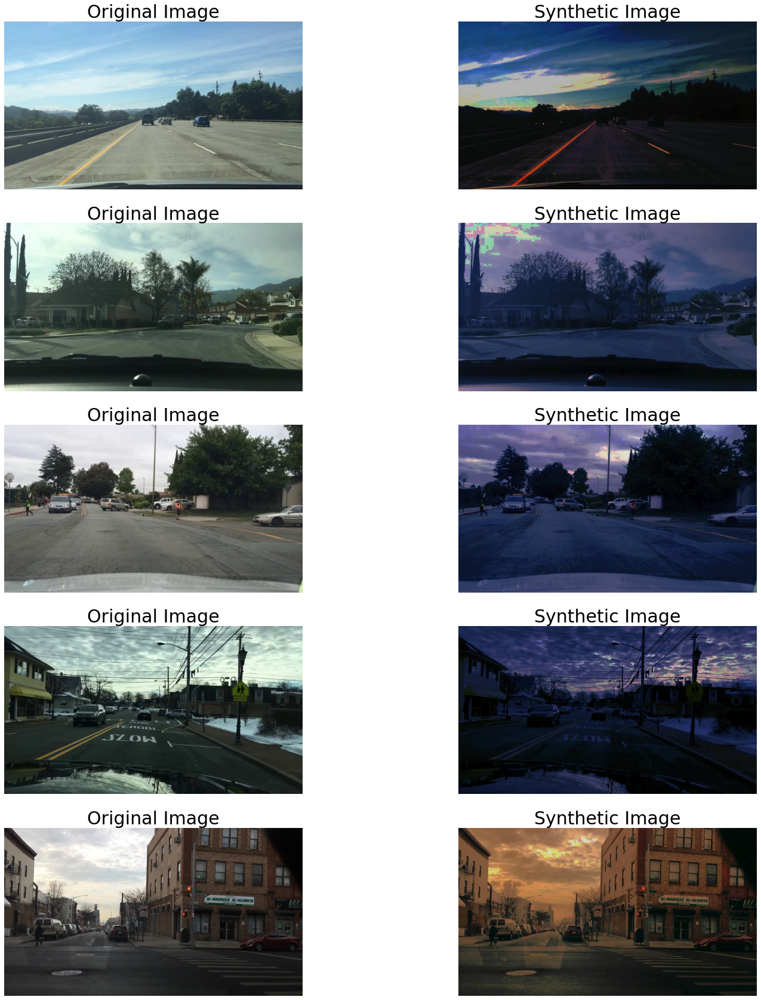

In [ ]:
temporary_path = "/content/drive/Shareddrives/EE610_Project"
N = 2456

figure = plt.figure(figsize=(25,30))

count = 0

for i in Image_list[N:N+5]:

  undegraded_path = temporary_path + "/train/" + i 
  degraded_path = temporary_path + "/Degraded_Images_new/" + i
  
  testing_image = skimage.io.imread(undegraded_path)
  template_image = skimage.io.imread(degraded_path)

  figure.add_subplot(5,2,2*count+1)
  plt.title("Original Image",fontsize = 30)
  plt.imshow(testing_image)
  plt.axis("off")

  figure.add_subplot(5,2,2*count+2)
  plt.title("Synthetic Image",fontsize = 30)
  plt.imshow(template_image)
  plt.axis("off")

  count = count + 1

plt.show()

Now, applying the same techniques on Test and Validation dataset as well.

In [ ]:
validation_folder_path = r"/content/drive/Shareddrives/EE610_Project"
validation_Image_list = os.listdir(validation_folder_path+"/val")
i = 0

for image in validation_Image_list:

    if(i%500 == 0):
      print("Validation Images degraded : ",i)
    
    i = i+1

    image_path = validation_folder_path + "/val/" +  image
    Clean_image = skimage.io.imread(image_path)
    
    Gamma = float(random.uniform(1,1.4))
    Alpha = random.uniform(0.8,1)
    Beta = random.uniform(0.8,1)

    Template_selector = random.randint(0,len(reference_image_list)-1)
    Template_path = reference_image_folder + "/" + str(reference_image_list[Template_selector])

    Template = skimage.io.imread(Template_path)
    
    Beta_Template = (Beta*Template)

    Degraded_image = match_histograms(Clean_image,Beta_Template,multichannel=True)
    Degraded_image = np.round(Alpha*adjust_gamma(Degraded_image,gamma = Gamma)).astype(np.uint8)
    Degraded_image = skimage.util.img_as_ubyte(Degraded_image)
    skimage.io.imsave(validation_folder_path+"/Degraded_Images_Validation/"+image,arr=Degraded_image) 

Validation Images degraded :  0
Validation Images degraded :  500


In [ ]:
test_folder_path = r"/content/drive/Shareddrives/EE610_Project"
test_Image_list = os.listdir(test_folder_path+"/test")
i = 0

for image in test_Image_list:

    if(i%500 == 0):
      print("Test Images degraded : ",i)
    
    i = i+1

    image_path = test_folder_path + "/test/" +  image
    Clean_image = skimage.io.imread(image_path)
    
    Gamma = float(random.uniform(1,1.4))
    Alpha = random.uniform(0.8,1)
    Beta = random.uniform(0.8,1)

    Template_selector = random.randint(0,len(reference_image_list)-1)
    Template_path = reference_image_folder + "/" + str(reference_image_list[Template_selector])

    Template = skimage.io.imread(Template_path)
    
    Beta_Template = (Beta*Template)

    Degraded_image = match_histograms(Clean_image,Beta_Template,multichannel=True)
    Degraded_image = np.round(Alpha*adjust_gamma(Degraded_image,gamma = Gamma)).astype(np.uint8)
    Degraded_image = skimage.util.img_as_ubyte(Degraded_image)
    skimage.io.imsave(test_folder_path+"/Degraded_Images_test/"+image,arr=Degraded_image) 

Test Images degraded :  0
Test Images degraded :  500
Test Images degraded :  1000
Test Images degraded :  1500


<a name="1.4"></a>
##1.4 TensorFlow Data Pipeline

In this section, we will be implementing TensorFlow data pipeline for handling large data efficiently because, even after using Colab Pro loading whole data in RAM is not feasible. 

TensorFlow data pipeline allows us to load data from file and use that to train our model while parallely loading the data from file making whole training process smooth.

Approach:

1. Extract all the file names from the folder of degraded images and original images
2. Define a function that loads images from file using TensorFlow methods (load()).
3. Function that takes input as takes file names as input loads the image using load() function from step-2, Resizes and Normalizes the image (load_image())
4. Use TensorFlow dataset (TFDS) functions to create TFDS from lists found from step-1
5. Use load_image() function in tensorflow dataset map function
6. Shuffle the dataset and define the batch side
7. Repeat same steps (1-6) Validation Dataset

#### Step-1 Load List of files

In [ ]:
# Function for load_all the directory 
def load_path(path_deg, path_orig):

  degraded = sorted(glob(os.path.join(path_deg,'*')))
  original = sorted(glob(os.path.join(path_orig,'*')))

  return degraded, original

#### Step-2: load image from file

In [ ]:
def load(image_file_deg, image_file_orig):
  # Read and decode an image file to a uint8 tensor
  image_degrade = tf.io.read_file(image_file_deg)
  image_degrade = tf.image.decode_jpeg(image_degrade)

  image_label = tf.io.read_file(image_file_orig)
  image_label = tf.image.decode_jpeg(image_label)
  
  input_image = image_degrade
  real_image = image_label

  # Convert both images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

(-0.5, 1279.5, 719.5, -0.5)

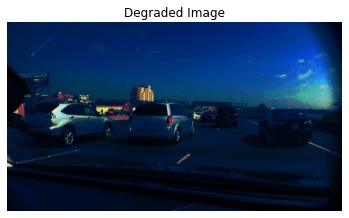

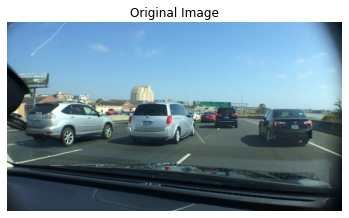

In [ ]:
path_train_deg = '/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images_train'
path_train_orig = '/content/drive/Shareddrives/EE610_Project/Data/Original_train'
inp, re = load(str(path_train_deg+'/00d1c9e3-a7a7075f.jpg'), str(path_train_orig +'/00d1c9e3-a7a7075f.jpg'))
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp/255)
plt.title('Degraded Image')
plt.axis("off")
plt.figure()
plt.imshow(re/255)
plt.title('Original Image')
plt.axis("off")

####Step-3 Resize, Normalize and load image 

In [ ]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_WIDTH = 512
IMG_HEIGHT = 256

In [ ]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [ ]:
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

Text(0.5, 1.0, 'Original Image')

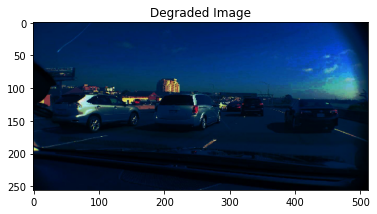

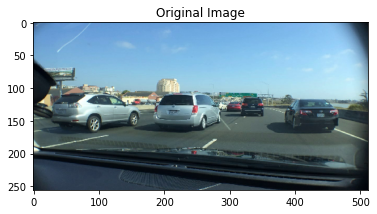

In [ ]:
inp,re = resize(inp,re,IMG_HEIGHT, IMG_WIDTH)
plt.figure()
plt.imshow(inp/255)
plt.title('Degraded Image')
plt.figure()
plt.imshow(re/255)
plt.title('Original Image')

In [ ]:
def load_image(image_file_deg, image_file_orig):
  input_image, real_image = load(image_file_deg, image_file_orig)
  input_image, real_image = resize(input_image, real_image,IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

#### Step-4, 5 and 6: create TF dataset and shuffle, and define batch size

In [ ]:
path_train_deg = '/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images_train'
path_train_orig = '/content/drive/Shareddrives/EE610_Project/Data/Original_train'
degraded_path, original_path = load_path(path_train_deg, path_train_orig)
train_dataset = tf.data.Dataset.from_tensor_slices((degraded_path, original_path))
train_dataset = train_dataset.map(load_image,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)
print(train_dataset)


<BatchDataset shapes: ((None, 256, 512, None), (None, 256, 512, None)), types: (tf.float32, tf.float32)>


####Step-7: Validation Dataset

In [ ]:
path_val_deg = '/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images_val'
path_val_orig = '/content/drive/Shareddrives/EE610_Project/Data/Original_val'
degraded_path, original_path = load_path(path_val_deg, path_val_orig)
test_dataset = tf.data.Dataset.from_tensor_slices((degraded_path, original_path))
test_dataset = test_dataset.map(load_image,
                                  num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = test_dataset.shuffle(BUFFER_SIZE)
test_dataset = test_dataset.batch(BATCH_SIZE)
print(test_dataset.take(1))

<TakeDataset shapes: ((None, 256, 512, None), (None, 256, 512, None)), types: (tf.float32, tf.float32)>


<a name="2"></a>
# 2 Histogram Equalization Techniques
# Applying classical techniques for image enhancement.

<a name="2.1"></a>
##2.1 CLAHE(Contrast Limited Adaptive Histogram Equalization)
CLAHE is a variant of Adaptive histogram equalization (AHE) which takes care of over-amplification of the contrast. CLAHE operates on small regions in the image, called tiles, rather than the entire image. 


$g=[g_{max}-g_{min}]*P_{f}+ g_{min}$

where, 

$g$=Computed picture element magnitude

$g_{max}$=Maximum picture element value

$g_{min}$=Minimum picture element magnitude

$p_{f}$=Cumulative distribution function.

For CLAHE implementation, direct function of OpenCV for applying CLAHE is used [CLAHE reference class](https://docs.opencv.org/3.4/d6/db6/classcv_1_1CLAHE.html) 




In [ ]:
#.......Function for applying CLAHE.............................................
def CLAHE(img):
  
  lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

  lab_planes = cv2.split(lab)
  lab_planes=np.array(lab_planes)
  lab_planes = lab_planes.astype(np.uint8)
#.......clipLimit Sets threshold for contrast limiting..........................
#.......tileGridSize defines the number of tiles in row and column..............
  clahe = cv2.createCLAHE(clipLimit=6.0,tileGridSize=(8,8))

  lab_planes[0] = clahe.apply(lab_planes[0])

  lab = cv2.merge(lab_planes)

  bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
  return bgr


In [ ]:
test_image_degraded = skimage.io.imread(r"/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images_train/0af801e9-aa8d36ab.jpg")
test_image = skimage.io.imread(r"/content/drive/Shareddrives/EE610_Project/Data/Original_train/0af801e9-aa8d36ab.jpg")

Text(0.5, 1.0, 'CLAHE')

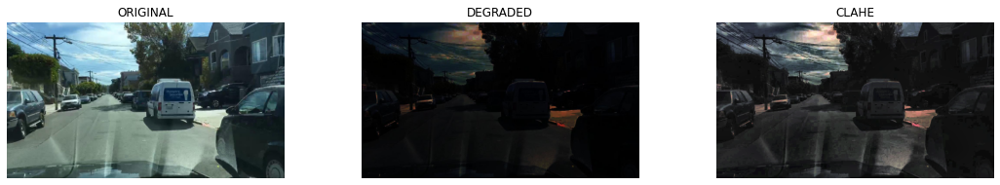

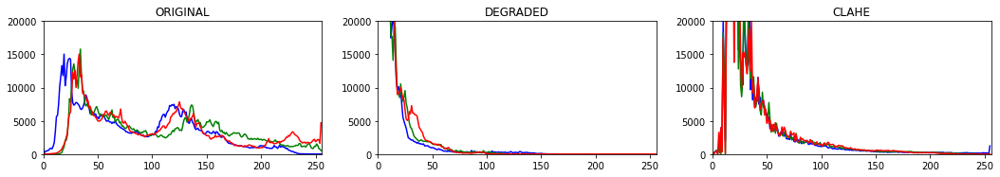

In [ ]:
plt.figure(figsize=(25,10))
rows, cols = 3,4
plt.subplot(rows, cols, 1)
plt.imshow(test_image)
plt.axis("off")
plt.title("ORIGINAL")
plt.subplot(rows, cols, 2)
plt.imshow(test_image_degraded)
plt.title("DEGRADED")
plt.axis("off")
plt.subplot(rows, cols, 3)
img_equalize=CLAHE(test_image_degraded)
plt.imshow(img_equalize)
plt.title("CLAHE")
plt.axis("off")
plt.figure(figsize=(17.9,15))
rows, cols = 5,3
plt.subplot(rows, cols, 1)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([test_image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("ORIGINAL")
plt.subplot(rows, cols, 2)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([test_image_degraded],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("DEGRADED")
plt.subplot(rows, cols, 3)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([img_equalize],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("CLAHE")

##Parameters used in implementing the equations of retinex algorithm

In [ ]:
sigma=80                  # Variance
sigma_list=[80,150,250]   # List of variances
G=5.0                     # gain
b=25.0                    # offset
alpha=125.0               # Controller for non linearity
beta=46.0                 # Gain
low_clip= 0.01            # lower clipping level
high_clip=0.99            # higher clipping level

<a name="2.2"></a>
##2.2 Retinex based techniques
The retinex algorithm divides the source image into illumination and reflection components. It is inferred that when we subtract or remove the illumination part and keep the reflection part of the image, the original image becomes enhanced.

Retinex theory is described in [Performance Analysis of Retinex Based
Algorithms for Enhancement of Low Light Images](https://iopscience.iop.org/article/10.1088/1742-6596/1964/6/062046).

The basic idea and some code segment for the implementation of retinex based algorithms in python is being taken from [Retinex image enhancement](https://github.com/aravindskrishnan/Retinex-Image-Enhancement)


<a name="2.2.1"></a>
### 2.2.1 Single scale Retinex(SSR)

$R_{i}(x,y)=\log I_{i}(x,y)-\log[I_{i}(x,y)\circledast F(x,y)]$

$             F(x,y)=Ce^{\frac{-(x^2 +y^2)}{2\sigma_{n}^2}}$


where, $R_{i}$ is the retinex image, $I_{i}$ is the applied source image, F is  the surround function for each color channel of the image which is a gaussian low pass filter.


In [ ]:
#......Function for applying SSR................................................
def singleScaleRetinex(img,sigma):
#......Applying SSR algorithm on the given image................................
  retinex = np.log10(img) - np.log10(cv2.GaussianBlur(img, (0, 0), sigma))
  return retinex


#......Function for removing NAN values and convert image into displayable range
#......in SSR and MSR...........................................................
def Display_img(img, sigma_list,sigma,count):
  img = np.float64(img) + 1.0
  if count==0:
#......Calling SSR function.....................................................
    img_retinex = singleScaleRetinex(img, sigma)
  elif count==1:
#......Calling MSR function.....................................................
    img_retinex= multiScaleRetinex(img, sigma_list)
  for i in range(img_retinex.shape[2]):
#.....Finding unique values in the returned output of the SSR/MSR function......
      unique, count = np.unique(np.int32(img_retinex[:, :, i] * 100), return_counts=True)
      for u, c in zip(unique, count):
          if u == 0:
              zero_count = c
              break            
      low_val = unique[0] / 100.0
      high_val = unique[-1] / 100.0
      for u, c in zip(unique, count):
          if u < 0 and c < zero_count * 0.1:
              low_val = u / 100.0
          if u > 0 and c < zero_count * 0.1:
              high_val = u / 100.0
              break            
      img_retinex[:, :, i] = np.maximum(np.minimum(img_retinex[:, :, i], high_val), low_val)
        
      img_retinex[:, :, i] = (img_retinex[:, :, i] - np.min(img_retinex[:, :, i])) / \
                               (np.max(img_retinex[:, :, i]) - np.min(img_retinex[:, :, i])) \
                               * 255
  img_retinex = np.uint8(img_retinex)        
  return img_retinex


Text(0.5, 1.0, 'SSR')

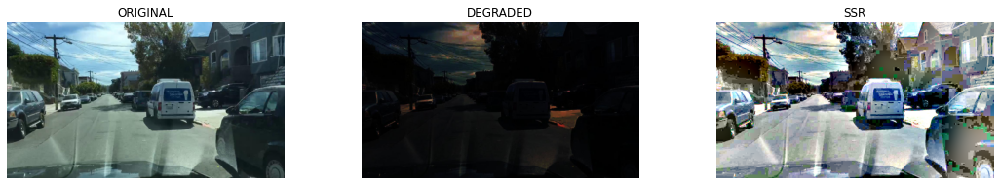

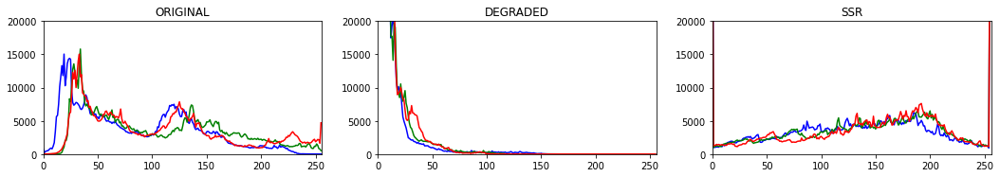

In [ ]:
plt.figure(figsize=(25,10))
rows, cols = 3,4
plt.subplot(rows, cols, 1)
plt.axis("off")
plt.imshow(test_image)
plt.title("ORIGINAL")
plt.subplot(rows, cols, 2)
plt.axis("off")
plt.imshow(test_image_degraded)
plt.title("DEGRADED")
plt.axis("off")
plt.subplot(rows, cols, 3)
count=0
img_ssr=Display_img(test_image_degraded,sigma_list,sigma,count)
plt.axis("off")
plt.imshow(img_ssr)
plt.title("SSR")
plt.figure(figsize=(17.9,15))
rows, cols = 5,3
plt.subplot(rows, cols, 1)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([test_image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("ORIGINAL")
plt.subplot(rows, cols, 2)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([test_image_degraded],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("DEGRADED")
plt.subplot(rows, cols, 3)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([img_ssr],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("SSR")


<a name="2.2.2"></a>
###2.2.2 Multi scale retinex(MSR)
${R_{MSRi}=\sum_{n=1}^{N}W_{n}[\log I_{i}-\log(F_{n}*I_{i})]}$

$I(x,y)=\frac{(I_{r}+I_{g}+I_{b})}{3.0}$

where N is the number of the scales used and $W_{n}$ is the weight of the nth scale.


In [ ]:
#......Function for applying MSR................................................
def multiScaleRetinex(img, sigma_list):
  retinex = np.zeros_like(img)
#......Applying all sigma values from the list..................................
  for sigma in sigma_list:
    retinex += singleScaleRetinex(img, sigma)
  retinex = retinex / len(sigma_list)
  return retinex

Text(0.5, 1.0, 'MSR')

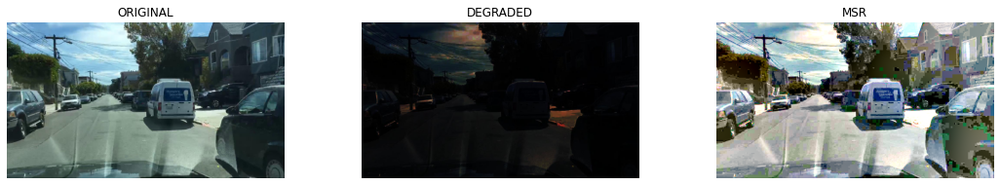

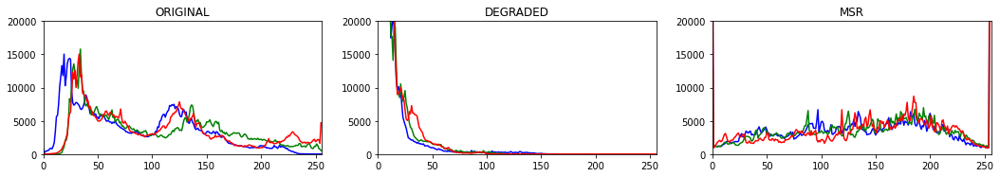

In [ ]:
plt.figure(figsize=(25,10))
rows, cols = 3,4
plt.subplot(rows, cols, 1)
plt.imshow(test_image)
plt.axis("off")
plt.title("ORIGINAL")
plt.subplot(rows, cols, 2)
plt.imshow(test_image_degraded)
plt.axis("off")
plt.title("DEGRADED")
plt.subplot(rows, cols, 3)
count=1
img_msr=Display_img(test_image_degraded,sigma_list,sigma,count)
plt.imshow(img_msr)
plt.axis("off")
plt.title("MSR")
plt.figure(figsize=(17.9,15))
rows, cols = 5,3
plt.subplot(rows, cols, 1)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([test_image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("ORIGINAL")
plt.subplot(rows, cols, 2)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([test_image_degraded],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("DEGRADED")
plt.subplot(rows, cols, 3)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([img_msr],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("MSR")


<a name="2.2.3"></a>
### 2.2.3 Multi scale retinex with colour restoration(MSRCR)
MSR seems to work much better than SSR, it also faces color distortion, which is overcome by MSRCR algorithm. HEre the colour restoration stage is added to MSR.


$R_{{MSRCR}_i}(x,y)=C_{i}.R_{{MSR}_i}(x,y)$

$C_{i}=f(I_{i}^{'})$

$C_{i}=β.\log(α.I_{i}^{'})$


$I_{i}^{'}=\frac{I_{i}(x,y)}{\sum_{j=1}^S I_{j}(x,y)}$

where,

$I_{i}^{'}\rightarrow$ colour balance/restoration

$S\rightarrow$spectral channels(S=3 for RGB)

$β\rightarrow$gain

$α\rightarrow$controls non linearity

$R_{{MSRCR}_i}(x,y)=255.\frac{R_{{MSRCR}_i}(x,y)-min_{i}(min_(x,y)R_{{MSRCR}_i}(x,y))}{max_{i}(max_{(x,y)}R_{{MSRCR}_i}(x,y))-min_{i}(min_{(x,y)}R_{{MSRCR}_i}(x,y))}$

$R_{{MSRCR}_i}(x,y)=G[R_{{MSRCR}_i}(x,y)-b]$
where,

G and b$\rightarrow$gain and offset parameters

In [ ]:
#......Function for performing colour restoration in MSRCR......................
def colorRestoration(img, alpha, beta):

  img_sum = np.sum(img, axis=2, keepdims=True)

  color_restor_img = beta * (np.log10(alpha * img) - np.log10(img_sum))

  return color_restor_img


#......Function for removing NAN values and convert image into displayable range
#......in MSRCR and MSRCP.......................................................
def simplestColorBalance(img, low_clip, high_clip):    

  total = img.shape[0] * img.shape[1]
  for i in range(img.shape[2]):
      unique, counts = np.unique(img[:, :, i], return_counts=True)
      current = 0
      for u, c in zip(unique, counts):            
          if float(current) / total < low_clip:
              low_val = u
          if float(current) / total < high_clip:
              high_val = u
          current += c
                
      img[:, :, i] = np.maximum(np.minimum(img[:, :, i], high_val), low_val)

  return img   




#.......Function for applying MSRCR.............................................
def MSRCR(img, sigma_list, G, b, alpha, beta, low_clip, high_clip):

    img = np.float64(img) + 1.0
    count=1
    img_retinex = Display_img(img, sigma_list,sigma,count)    
    img_color = colorRestoration(img, alpha, beta)    
    img_msrcr = G * (img_retinex * img_color - b)

    for i in range(img_msrcr.shape[2]):
        img_msrcr[:, :, i] = (img_msrcr[:, :, i] - np.min(img_msrcr[:, :, i])) / \
                             (np.max(img_msrcr[:, :, i]) - np.min(img_msrcr[:, :, i])) * \
                             255
    
    img_msrcr = np.uint8(np.minimum(np.maximum(img_msrcr, 0), 255))
    img_msrcr = simplestColorBalance(img_msrcr, low_clip, high_clip)       

    return img_msrcr 

Text(0.5, 1.0, 'MSRCR')

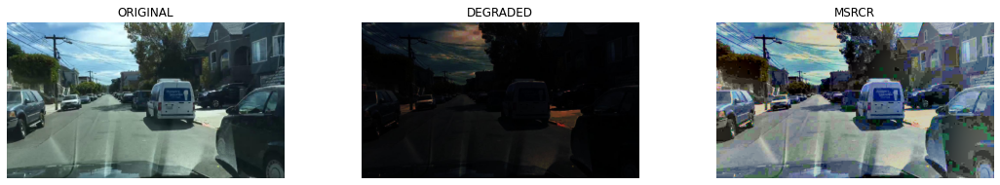

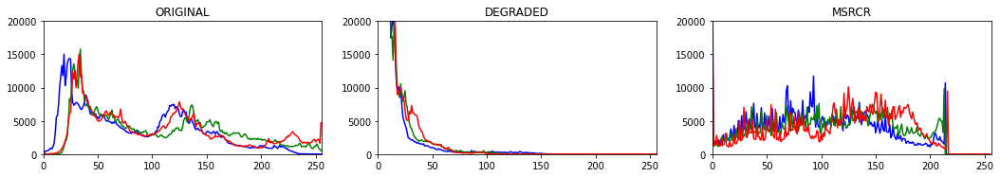

In [ ]:
plt.figure(figsize=(25,10))
rows, cols = 3,4
plt.subplot(rows, cols, 1)
plt.imshow(test_image)
plt.title("ORIGINAL")
plt.axis("off")
plt.subplot(rows, cols, 2)
plt.imshow(test_image_degraded)
plt.axis("off")
plt.title("DEGRADED")
plt.subplot(rows, cols, 3)
img_msrcr=MSRCR(test_image_degraded, sigma_list, G, b, alpha, beta, low_clip, high_clip)
plt.imshow(img_msrcr)
plt.axis("off")
plt.title("MSRCR")
plt.figure(figsize=(17.9,15))
rows, cols = 5,3
plt.subplot(rows, cols, 1)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([test_image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("ORIGINAL")
plt.subplot(rows, cols, 2)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([test_image_degraded],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("DEGRADED")
plt.subplot(rows, cols, 3)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([img_msrcr],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("MSRCR")






<a name="2.2.4"></a>
### 2.2.4 Multi scale retinex with colour preservation(MSRCP)

MSRP algorithm uses each of the image channels intensity information and the MSR algorithm to enhance the image. For images having accurate color distribution and exposure of white light, the outcome on implementing MSRCP conserves the color balance.
$I(x,y)=\frac{\sum_{j=1}^S I_{j}(x,y)}{S}$

$S\rightarrow$number of channels

$R^{'}_{{MSRCP}_i}=min(\frac{255}{max(I_{R_{i}}+I_{G_{i}}+I_{B_{i}},\frac{int_{1_{i}}}{int(i)})})$

$R_{{MSRCP}_i}=G.[R^{'}_{{MSRCP}_i}]+b$

$I_{i}\rightarrow$input image

$int_{1}\rightarrow$ colour restoration

G and b$\rightarrow$gain and offset parameters

In [ ]:

#.......Function for applying MSRCP.............................................
def MSRCP(img, sigma_list, low_clip, high_clip):

    img = np.float64(img) + 1.0

    intensity = np.sum(img, axis=2) / img.shape[2]    

    retinex = multiScaleRetinex(intensity, sigma_list)
    
    
    intensity = np.expand_dims(intensity, 2)
    retinex = np.expand_dims(retinex, 2)

    intensity1 = simplestColorBalance(retinex, low_clip, high_clip)

    intensity1 = (intensity1 - np.min(intensity1)) / \
                 (np.max(intensity1) - np.min(intensity1)) * \
                 255.0 + 1.0

    img_msrcp = np.zeros_like(img)
    
    for y in range(img_msrcp.shape[0]):
        for x in range(img_msrcp.shape[1]):
            B = np.max(img[y, x])
            A = np.minimum(256.0 / B, intensity1[y, x, 0] / intensity[y, x, 0])
            img_msrcp[y, x, 0] = A * img[y, x, 0]
            img_msrcp[y, x, 1] = A * img[y, x, 1]
            img_msrcp[y, x, 2] = A * img[y, x, 2]

    img_msrcp = np.uint8(img_msrcp-1.0)

    return img_msrcp

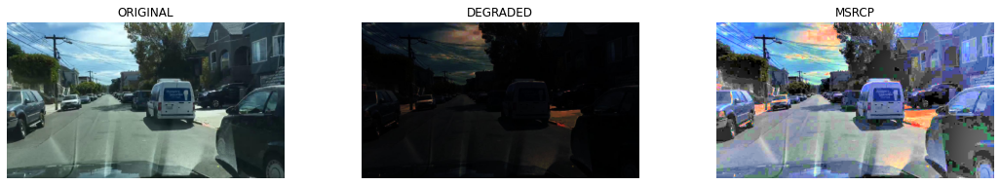

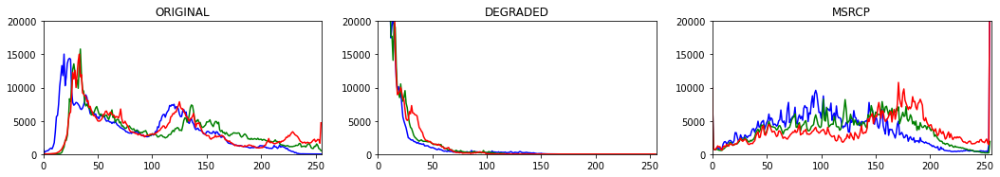

In [ ]:
plt.figure(figsize=(25,10))
rows, cols = 3,4
plt.subplot(rows, cols, 1)
plt.imshow(test_image)
plt.axis("off")
plt.title("ORIGINAL")
plt.subplot(rows, cols, 2)
plt.imshow(test_image_degraded)
plt.axis("off")
plt.title("DEGRADED")
plt.subplot(rows, cols, 3)
img_msrcp=MSRCP(test_image_degraded, sigma_list, low_clip, high_clip)
plt.imshow(img_msrcp)
plt.axis("off")
plt.title("MSRCP")
plt.show()
plt.figure(figsize=(17.9,15))
rows, cols = 5,3
plt.subplot(rows, cols, 1)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([test_image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("ORIGINAL")
plt.subplot(rows, cols, 2)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([test_image_degraded],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("DEGRADED")
plt.subplot(rows, cols, 3)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([img_msrcp],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("MSRCP")
plt.show()


Comparison between the above mentioned images.

In [ ]:
test_image_degraded = skimage.io.imread(r"/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images_train/b001a7ce-5cbc6e0b.jpg")
test_image = skimage.io.imread(r"/content/drive/Shareddrives/EE610_Project/Data/Original_train/b001a7ce-5cbc6e0b.jpg")

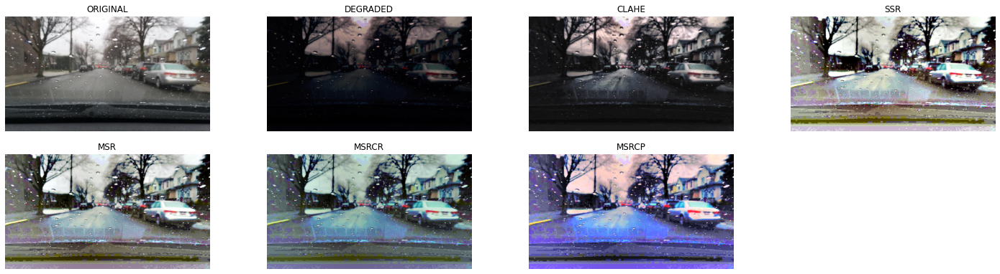

In [ ]:
plt.figure(figsize=(25,10))
rows, cols = 3,4
plt.subplot(rows, cols, 1)
plt.imshow(test_image)
plt.axis("off")
plt.title("ORIGINAL")
plt.subplot(rows, cols, 2)
plt.imshow(test_image_degraded)
plt.axis("off")
plt.title("DEGRADED")
plt.subplot(rows, cols, 3)
img_equalize=CLAHE(test_image_degraded)
plt.imshow(img_equalize)
plt.axis("off")
plt.title("CLAHE")
plt.subplot(rows, cols, 4)
count=0
img_ssr=Display_img(test_image_degraded,sigma_list,sigma,count)
plt.imshow(img_ssr)
plt.title("SSR")
plt.axis("off")
plt.subplot(rows, cols, 5)
count=1
img_msr=Display_img(test_image_degraded,sigma_list,sigma,count)
plt.imshow(img_msr)
plt.axis("off")
plt.title("MSR")
plt.subplot(rows, cols, 6)
img_msrcr=MSRCR(test_image_degraded, sigma_list, G, b, alpha, beta, low_clip, high_clip)
plt.imshow(img_msrcr)
plt.axis("off")
plt.title("MSRCR")
plt.subplot(rows, cols, 7)
img_msrcp=MSRCP(test_image_degraded, sigma_list, low_clip, high_clip)
plt.imshow(img_msrcp)
plt.axis("off")
plt.title("MSRCP")
plt.show()

Histograms for the different methods.

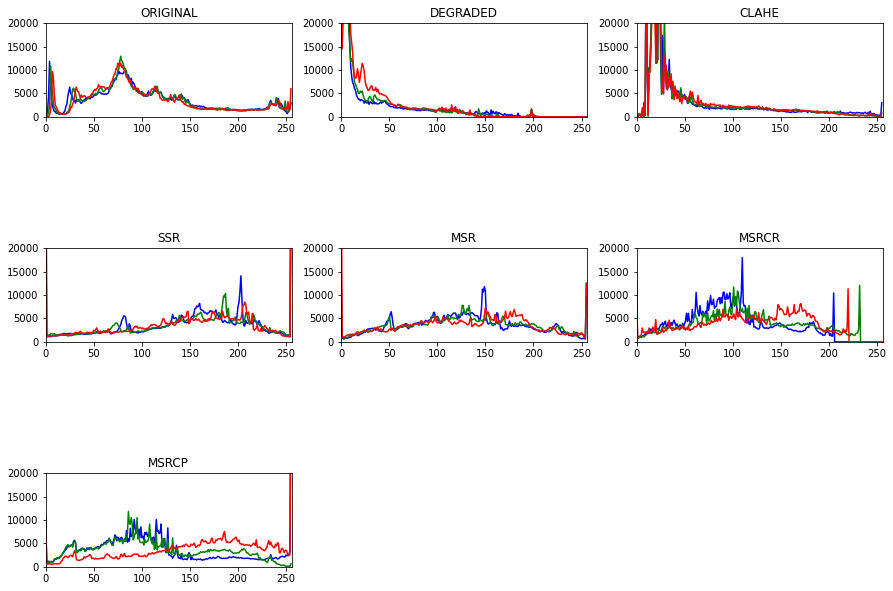

In [ ]:
plt.figure(figsize=(15,10))
rows, cols = 5,3
plt.subplot(rows, cols, 1)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([test_image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("ORIGINAL")
plt.subplot(rows, cols, 2)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([test_image_degraded],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("DEGRADED")
plt.subplot(rows, cols, 3)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([img_equalize],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("CLAHE")
plt.subplot(rows, cols, 7)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([img_ssr],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("SSR")
plt.subplot(rows, cols, 8)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([img_msr],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("MSR")
plt.subplot(rows, cols, 9)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([img_msrcr],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("MSRCR")
plt.subplot(rows, cols, 13)
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([img_msrcp],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,20000])
plt.title("MSRCP")
plt.show()

<a name="3"></a>
# 3 Learning Based Techniques



<a name="3.1"></a>
## 3.1 Context aggregation network (CAN) architecture (Design and summary)



The CAN network essentially is processing the image using only Convolutional layers, having same kernel size and dilation rate increasing in the powers of two. The version of CAN that we implemented is CAN24 which means each layer has 24 filters. The dilation rate for the 10 layers is : 1,2,4,16,32,64,128 and 1 for the final two layers. All layers have 24 filters, except for the final layer which has 3 filters to mimic R, G and B channel. 

In [ ]:
# Model definition

model = Sequential()

model.add(layers.Conv2D(filters = 24, kernel_size = (3,3), 
                        dilation_rate=(1,1),input_shape = (224,224,3),activation=tf.nn.leaky_relu,name="Conv2D_1",padding='same')) #Initial_layer 

number_layers = 8

for i in range(2,number_layers+1):

  temp = "Conv2D_" + str(i)
  model.add(layers.Conv2D(filters = 24, kernel_size = (3,3), dilation_rate=(2**(i-1),2**(i-1)),activation=tf.nn.leaky_relu,name=temp,padding='same')) #Next_layers

  print("Layer added : ",i," Dilation rate : ",2**(i-1))

model.add(layers.Conv2D(filters = 24, kernel_size = (3,3), dilation_rate=(1,1),activation=tf.nn.leaky_relu,name="Conv2D_9",padding='same')) #Layer 9

model.add(layers.Conv2D(filters = 3, kernel_size = (1,1), dilation_rate=(1,1),activation="relu",name="Conv2D_10",padding='same')) # Output Layer

model.compile(optimizer = "adam",loss="mse")

model.summary()

Layer added :  2  Dilation rate :  2
Layer added :  3  Dilation rate :  4
Layer added :  4  Dilation rate :  8
Layer added :  5  Dilation rate :  16
Layer added :  6  Dilation rate :  32
Layer added :  7  Dilation rate :  64
Layer added :  8  Dilation rate :  128
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv2D_1 (Conv2D)           (None, 224, 224, 24)      672       
                                                                 
 Conv2D_2 (Conv2D)           (None, 224, 224, 24)      5208      
                                                                 
 Conv2D_3 (Conv2D)           (None, 224, 224, 24)      5208      
                                                                 
 Conv2D_4 (Conv2D)           (None, 224, 224, 24)      5208      
                                                                 
 Conv2D_5 (Conv2D)           (None, 224, 224, 24)     

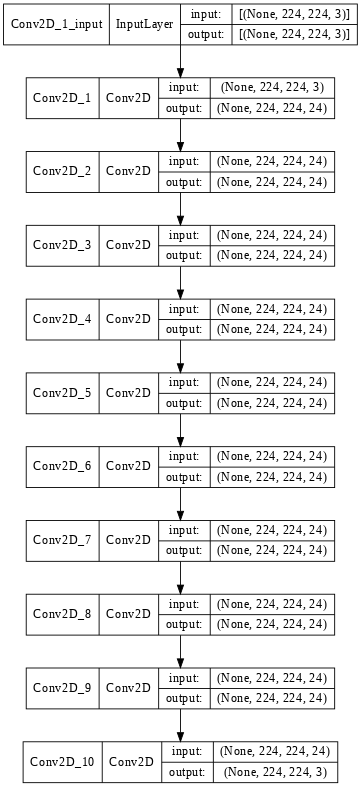

In [ ]:
tf.keras.utils.plot_model(model, show_shapes=True, dpi=64)

Here, we have stopped the training at 1 epoch, but we had trained it earlier for longer period and saved it. Since each epoch was taking more than an hour to train. We had trained it and saved it in the folder itself. Hence below we have attached the code cell of the model being trained for a single epoch by pressing the keyboard interrupt.

In [ ]:
model.fit(train_dataset,epochs = 5)

Epoch 1/5
7009/7009 [==============================] - 5273s 751ms/step - loss: 0.2535
Epoch 2/5
1820/7009 [======>.......................] - ETA: 1:05:13 - loss: 0.2474

KeyboardInterrupt: ignored

In [ ]:
model = keras.models.load_model(r"/content/drive/Shareddrives/EE610_Project/Models/Nihar/Nihar_model_224x224.h5")

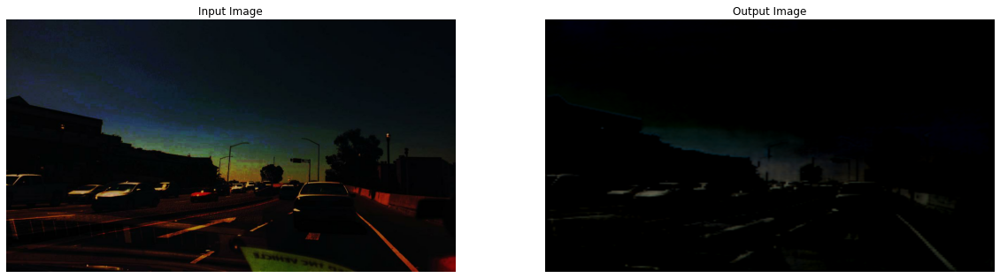

In [ ]:
img = tf.io.read_file(r"/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images_test/7d4a9094-0455564b.jpg")
img = tf.image.decode_jpeg(img, channels=3)

resized_image_ip = tf.image.resize(img, [224, 224])

resized_image_ip = tf.cast(resized_image_ip,dtype=tf.float32)

resized_image_ip = tf.reshape(resized_image_ip,(1,224, 224,3))

op_img = model.predict(resized_image_ip)

op_img = (tf.reshape(op_img,(224,224,3)))

op_img = (tf.image.resize(op_img, [img.shape[0],img.shape[1]]).numpy()).astype(np.uint8)

figure = plt.figure(figsize = (20,15))

figure.add_subplot(1,2,1)
plt.title("Input Image")
plt.axis("off")
plt.imshow(img)

figure.add_subplot(1,2,2)
plt.title("Output Image")
plt.axis("off")
plt.imshow(op_img)

plt.show()


The network did not give better results since it was only trained for very few epochs due to limited computation power. However we can see the sky almost starting to retain blue colour of daylight.

<a name="3.2"></a>
## 3.2 UNET architecture (Design and summary)
[UNET](https://arxiv.org/abs/1505.04597) architecture is symmetric and consists of two major parts as shown below the left part is **contraction path** which is constituted the general covolutional process, the right part is **expansive path**, which is constituted by transposed 2d convolutional layers.
<center> 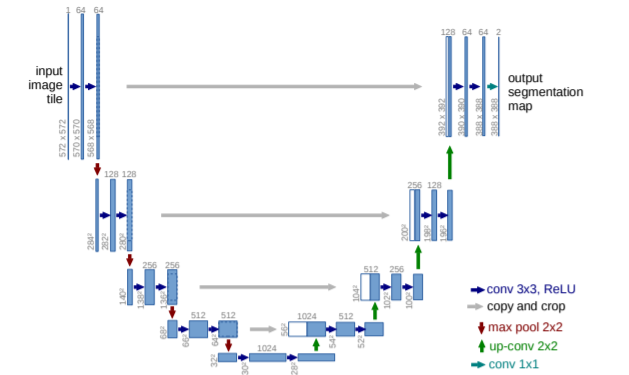 <center/>




* UNet is able to do image localization by predicting the image pixel by pixel.
* In the first model batch normalization is not used but used in model 2 which theoretically prevents the training to getting stuck in the saturated regimes of nonlinearities but needs more computational power as discribed in cells below.

<a name="3.2.1"></a>
####3.2.1 Model-1

In [ ]:
seed = 42
np.random.seed = seed

IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 3
#Build the model
inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs)

#Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)
 
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)
 
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)
 
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
c5 = tf.keras.layers.Dropout(0.3)(c5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

#Expansive path 
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
c6 = tf.keras.layers.Dropout(0.2)(c6)
c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
 
u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
u7 = tf.keras.layers.concatenate([u7, c3])
c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
c7 = tf.keras.layers.Dropout(0.2)(c7)
c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
 
u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
u8 = tf.keras.layers.concatenate([u8, c2])
c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
c8 = tf.keras.layers.Dropout(0.1)(c8)
c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
 
u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
c9 = tf.keras.layers.Dropout(0.1)(c9)
c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)
 
outputs = tf.keras.layers.Conv2D(3, (1, 1), activation='relu')(c9)
 
model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 lambda (Lambda)                (None, 128, 128, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 16  448         ['lambda[0][0]']                 
                                )                                                                 
                                                                                              

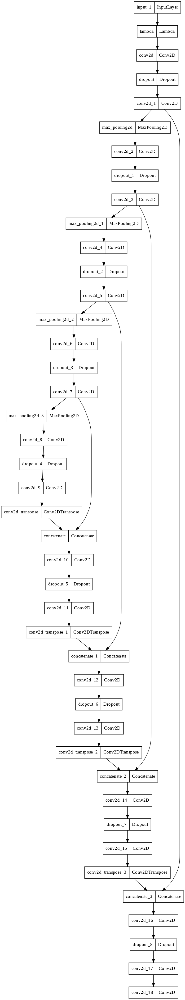

In [ ]:
tf.keras.utils.plot_model(model,dpi=100,to_file='modelunet.png')

Training, Validation and Test Path

In [ ]:

X_train_path = r"/content/drive/Shareddrives/EE610_Project/Data/Original_train"
Y_train_path = r"/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images_train"

X_valid_path = r"/content/drive/Shareddrives/EE610_Project/Data/Original_val"
Y_valid_path = r"/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images_val"

X_test_path = r"/content/drive/Shareddrives/EE610_Project/Data/Original_test"
Y_test_path = r"/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images_test"

Here **parse_function**  takes image as an input and decodes jpeg to uint8 followed by resizing and casting it to float32 and then finally returns an resized image.

In [ ]:
def parse_function(filename_ip, filename_op):
    image_string_ip = tf.io.read_file(filename_ip)
    image_string_op = tf.io.read_file(filename_op)

    image_ip = tf.image.decode_jpeg(image_string_ip, channels=3)
    image_op = tf.image.decode_jpeg(image_string_op, channels=3)
    resized_image_ip = tf.image.resize(image_ip, [128, 128])
    resized_image_op = tf.image.resize(image_op, [128, 128])
    resized_image_ip,resized_image_ip=normalize(resized_image_ip,resized_image_ip)

    resized_image_ip = tf.cast(resized_image_ip,dtype=tf.float32)
    resized_image_op = tf.cast(resized_image_op,dtype=tf.float32)


    return resized_image_ip, resized_image_op

**normalize** is to normalize the input image.

In [ ]:
def normalize(input_real,input_degraded):
  input_real=(input_real/127.5)-1
  input_degraded=(input_degraded/127.5)-1
  return input_real,input_degraded

In [ ]:
# Function for load_all the directory 
def load_path(path_orig, path_deg):

  degraded = sorted(glob(os.path.join(path_deg,'*')))
  original = sorted(glob(os.path.join(path_orig,'*')))

  return degraded, original
batch_size = 32

degraded,original = load_path(X_train_path, Y_train_path)
dataset = tf.data.Dataset.from_tensor_slices((original, degraded))
dataset = dataset.map(parse_function, num_parallel_calls=tf.data.AUTOTUNE)
dataset = dataset.batch(batch_size)
dataset = dataset.prefetch(1)

val_degraded,val_original = load_path(X_valid_path, Y_valid_path)
val_dataset = tf.data.Dataset.from_tensor_slices((val_original, val_degraded))
val_dataset = val_dataset.map(parse_function, num_parallel_calls=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(batch_size)

training and compiling the model

In [ ]:
model.compile(optimizer = "adam",loss="mse")
es=EarlyStopping(monitor='mse',patience=4,verbose=1)
model.fit(dataset,batch_size = 32, epochs =120,validation_data=val_dataset,callbacks=[es])
# keras.callbacks.ModelCheckpoint('/content/drive/Shareddrives/EE610_Project/Models/checkpoint_500epochs.h5',monitor='mse')
model.save('/content/drive/MyDrive/model_unet_31oct')
model.save('/content/drive/MyDrive/model_unet_31oct/model120_epoch.h5')

In [ ]:
model=tf.keras.models.load_model('/content/drive/MyDrive/model_unet_31oct')

visualizing the results

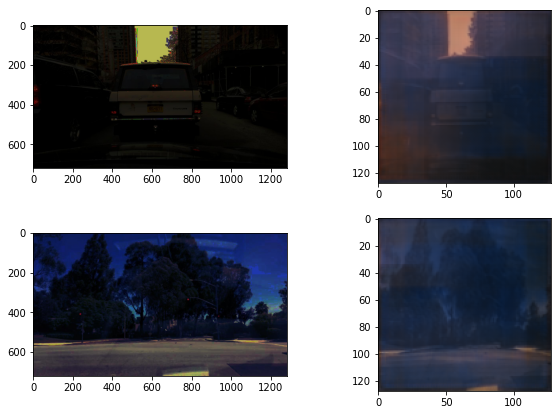

In [ ]:
img=imread('/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images_test/81f59cb8-3bfd8a02.jpg')
img10=imread('/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images_train/00e9be89-00000135.jpg')
img11=skimage.transform.resize(img10,(128,128,3))
img1=skimage.transform.resize(img,(128,128,3))
img1=img1.reshape(1,128,128,3)
img11=img11.reshape(1,128,128,3)
model = tf.keras.models.load_model('/content/drive/MyDrive/model_unet_31oct')
pd=model.predict(img1).reshape(128,128,3)
pd2=model.predict(img11).reshape(128,128,3)
plt.figure(figsize=(10,7))
plt.subplot(2,2,2)
plt.imshow(pd/255)
plt.subplot(2,2,1)
plt.imshow(img)
plt.subplot(2,2,3)
plt.imshow(img10)
plt.subplot(2,2,4)
plt.imshow(pd2/255)

<a name="3.2.2"></a>
####3.2.2 Model-2
Model 2 with batch normalization and  more conv2D layers. In this model to predict better results, dropout is applied after every second layer.

In [ ]:
############ contracting #############
## model 2
input_ = Input(shape=(128,128,3),name='input')                                              

block1_conv1 = Conv2D(64,3,padding='same',activation='relu',name='block1_conv1')(input_)
block1_conv2 = Conv2D(64,3,padding='same',activation='relu',name='block1_conv2')(block1_conv1)
block1_norm = BatchNormalization(name='block1_batch_norm')(block1_conv2)
block1_pool = MaxPooling2D(name='block1_pool')(block1_norm)

block2_conv1 = Conv2D(128,3,padding='same',activation='relu',name='block2_conv1')(block1_pool)
block2_conv2 = Conv2D(128,3,padding='same',activation='relu',name='block2_conv2')(block2_conv1)
block2_norm = BatchNormalization(name='block2_batch_norm')(block2_conv2)
block2_pool = MaxPooling2D(name='block2_pool')(block2_norm)

encoder_dropout_1 = Dropout(0.2,name='encoder_dropout_1')(block2_pool)

block3_conv1 = Conv2D(256,3,padding='same',activation='relu',name='block3_conv1')(encoder_dropout_1)
block3_conv2 = Conv2D(256,3,padding='same',activation='relu',name='block3_conv2')(block3_conv1)
block3_norm = BatchNormalization(name='block3_batch_norm')(block3_conv2)
block3_pool = MaxPooling2D(name='block3_pool')(block3_norm)

block4_conv1 = Conv2D(512,3,padding='same',activation='relu',name='block4_conv1')(block3_pool)
block4_conv2 = Conv2D(512,3,padding='same',activation='relu',name='block4_conv2')(block4_conv1)
block4_norm = BatchNormalization(name='block4_batch_norm')(block4_conv2)
block4_pool = MaxPooling2D(name='block4_pool')(block4_norm)
################### Encoder end ######################

block5_conv1 = Conv2D(1024,3,padding='same',activation='relu',name='block5_conv1')(block4_pool)
# encoder_dropout_2 = Dropout(0.2,name='encoder_dropout_2')(block5_conv1)

########### Decoder ################

up_pool1 = Conv2DTranspose(1024,3,strides = (2, 2),padding='same',activation='relu',name='up_pool1')(block5_conv1)
merged_block1 = concatenate([block4_norm,up_pool1],name='merged_block1')
decod_block1_conv1 = Conv2D(512,3, padding = 'same', activation='relu',name='decod_block1_conv1')(merged_block1)

up_pool2 = Conv2DTranspose(512,3,strides = (2, 2),padding='same',activation='relu',name='up_pool2')(decod_block1_conv1)
merged_block2 = concatenate([block3_norm,up_pool2],name='merged_block2')
decod_block2_conv1 = Conv2D(256,3,padding = 'same',activation='relu',name='decod_block2_conv1')(merged_block2)

decoder_dropout_1 = Dropout(0.2,name='decoder_dropout_1')(decod_block2_conv1)

up_pool3 = Conv2DTranspose(256,3,strides = (2, 2),padding='same',activation='relu',name='up_pool3')(decoder_dropout_1)
merged_block3 = concatenate([block2_norm,up_pool3],name='merged_block3')
decod_block3_conv1 = Conv2D(128,3,padding = 'same',activation='relu',name='decod_block3_conv1')(merged_block3)

up_pool4 = Conv2DTranspose(128,3,strides = (2, 2),padding='same',activation='relu',name='up_pool4')(decod_block3_conv1)
merged_block4 = concatenate([block1_norm,up_pool4],name='merged_block4')
decod_block4_conv1 = Conv2D(64,3,padding = 'same',activation='relu',name='decod_block4_conv1')(merged_block4)
############ Decoder End ######################################

# decoder_dropout_2 = Dropout(0.2,name='decoder_dropout_2')(decod_block4_conv1)

pre_output = Conv2D(64,3,padding = 'same',activation='relu',name='pre_output')(decod_block4_conv1)

output = Conv2D(3,1,padding='same',activation='softmax',name='output')(pre_output)

model2D = Model(inputs = input_, outputs = output)
model2D.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 128, 64  1792        ['input[0][0]']                  
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 128, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

**Observation:** The number of parameters has increased from approximately 2 million to 32 million. And as can be seen below each epoch is estimated to take about 3 hours of time. For 20 epochs, 20*=60 hours. 

In [ ]:
opt=keras.optimizers.Adam(learning_rate=0.00001)
model2D.compile(optimizer = opt,loss="mse")
# es=EarlyStopping(monitor='mse',patience=4,verbose=1)
model2D.fit(dataset,batch_size = 32, epochs =20,validation_data=val_dataset)
# keras.callbacks.ModelCheckpoint('/content/drive/Shareddrives/EE610_Project/Models/checkpoint_500epochs.h5',monitor='mse')
# model2D.save('/content/drive/MyDrive/model_unet_31oct')
model2D.save('/content/drive/MyDrive/model_unet_31oct/model2D_ip_30epochs.h5')

Epoch 1/20
 26/220 [==>...........................] - ETA: 3:14:00 - loss: 2970.6919

visualizing the results for second model doesn't predict anything due to lack of training.

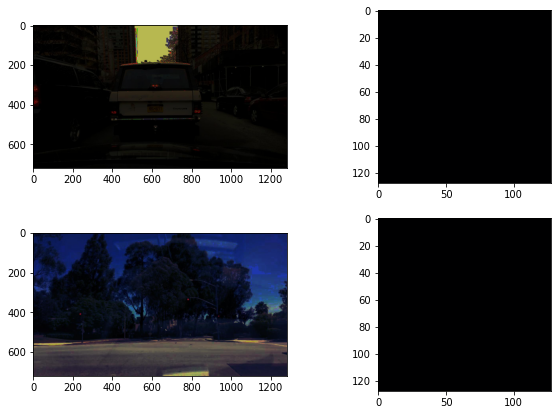

In [ ]:
import skimage
from skimage.io import imread, imshow
img=imread('/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images_test/81f59cb8-3bfd8a02.jpg')
img10=imread('/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images_train/00e9be89-00000135.jpg')
img11=skimage.transform.resize(img10,(128,128,3))
img1=skimage.transform.resize(img,(128,128,3))
# img1 = np.zeros(img1.shape)
img1=img1.reshape(1,128,128,3)
img11=img11.reshape(1,128,128,3)
model2 = tf.keras.models.load_model('/content/drive/MyDrive/model_unet_31oct')
pd=model2D.predict(img1).reshape(128,128,3)
pd2=model2D.predict(img11).reshape(128,128,3)
plt.figure(figsize=(10,7))
plt.subplot(2,2,2)
plt.imshow(pd/255)
# plt.show()
plt.subplot(2,2,1)
plt.imshow(img)
plt.subplot(2,2,3)
plt.imshow(img10)
plt.subplot(2,2,4)
plt.imshow(pd2/255)

<a name="3.2.3"></a>
####3.2.3 Model-3
Now that both the models did not provided a good result, we have picked up another architecture from [TensorFlow pix2pix tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix) and trained the model to get better results than above two models. Same model is used as generator for pix2pix implemetation

In [ ]:
OUTPUT_CHANNELS = 3

In [ ]:
# U-Net Model-3
initializer = tf.random_normal_initializer(0., 0.02)
x_in = tf.keras.layers.Input(shape=[256,512,3], name = "Input Layer")
#Encoder
# Block-1:
B1 = Conv2D(64, kernel_size=4, strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name = 'Block_1_Conv') (x_in)
# Block-2:
B2 = Conv2D(128, kernel_size= 4,strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_2_Conv') (B1)
B2 = BatchNormalization(name = 'Block_2_BatchNorm') (B2)
# Block-3:
B3 = Conv2D(256, kernel_size = 4,strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_3_Conv') (B2)
B3 = BatchNormalization(name = 'Block_3_BatchNorm') (B3)
# Block-4:
B4 = Conv2D(512, kernel_size = 4,strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_4_Conv') (B3)
B4 = BatchNormalization(name = 'Block_4_BatchNorm') (B4)
# Block-5:
B5 = Conv2D(512, kernel_size = 4,strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_5_Conv') (B4)
B5 = BatchNormalization(name = 'Block_5_BatchNorm') (B5)
# Block-6:
B6 = Conv2D(512, kernel_size = 4,strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_6_Conv') (B5)
B6 = BatchNormalization(name = 'Block_6_BatchNorm') (B6)
# Block-7:
B7 = Conv2D(512, kernel_size = 4,strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_7_Conv') (B6)
B7 = BatchNormalization(name = 'Block_7_BatchNorm') (B7)
# Block-8:
B8 = Conv2D(512, kernel_size = 4,strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_8_Conv') (B7)
B8 = BatchNormalization(name = 'Block_8_BatchNorm') (B8)
#Decoder
# Block-9
B9 = Conv2DTranspose(512,kernel_size=4,strides=2,padding='same',kernel_initializer= initializer,use_bias=False, activation='relu', name = 'Block_9_UpConv') (B8)
B9 = BatchNormalization(name = 'Block_9_BatchNorm') (B9)
B9 = Dropout(0.5, name = 'Block_9_Dropout') (B9)
B9 = concatenate([B9, B7], name= 'Block_9_Concat')
# Block-10
B10 = Conv2DTranspose(512,kernel_size=4,strides=2,padding='same',kernel_initializer= initializer,use_bias=False, activation='relu', name = 'Block_10_UpConv') (B9)
B10 = BatchNormalization(name = 'Block_10_BatchNorm') (B10)
B10 = Dropout(0.5, name = 'Block_10_Dropout') (B10)
B10 = concatenate([B10, B6], name= 'Block_10_Concat')
# Block-11
B11 = Conv2DTranspose(512,kernel_size=4,strides=2,padding='same',kernel_initializer= initializer,use_bias=False, activation='relu', name = 'Block_11_UpConv') (B10)
B11 = BatchNormalization(name = 'Block_11_BatchNorm') (B11)
B11 = Dropout(0.5, name = 'Block_11_Dropout') (B11)
B11 = concatenate([B11, B5], name= 'Block_11_Concat')
# Block-12
B12 = Conv2DTranspose(512,kernel_size=4,strides=2,padding='same',kernel_initializer= initializer,use_bias=False, activation='relu', name = 'Block_12_UpConv') (B11)
B12 = BatchNormalization(name = 'Block_12_BatchNorm') (B12)
B12 = concatenate([B12, B4], name= 'Block_12_Concat')
# Block-13
B13 = Conv2DTranspose(256,kernel_size=4,strides=2,padding='same',kernel_initializer= initializer,use_bias=False, activation='relu', name = 'Block_13_UpConv') (B12)
B13 = BatchNormalization(name = 'Block_13_BatchNorm') (B13)
B13 = concatenate([B13, B3], name= 'Block_13_Concat')
# Block-14
B14 = Conv2DTranspose(128,kernel_size=4,strides=2,padding='same',kernel_initializer= initializer,use_bias=False, activation='relu', name = 'Block_14_UpConv') (B13)
B14 = BatchNormalization(name = 'Block_14_BatchNorm') (B14)
B14 = concatenate([B14, B2], name= 'Block_14_Concat')
# Block-15
B15 = Conv2DTranspose(64,kernel_size=4,strides=2,padding='same',kernel_initializer= initializer,use_bias=False, activation='relu', name = 'Block_15_UpConv') (B14)
B15 = BatchNormalization(name = 'Block_15_BatchNorm') (B15)
B15 = concatenate([B15, B1], name= 'Block_15_Concat')
# Block-16
B16 = Conv2DTranspose(OUTPUT_CHANNELS, kernel_size= 4,strides=2,padding='same',kernel_initializer=initializer,activation='tanh', name ='Final_Layer') (B15)


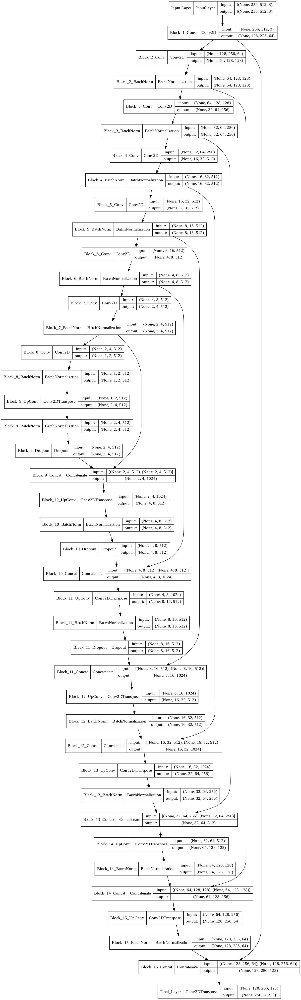

In [ ]:
u_net_3 = tf.keras.Model(x_in, B16)
tf.keras.utils.plot_model(u-net_3, show_shapes=True, dpi = 128, to_file = 'Generator_U-Net.png')

In [ ]:
u_net_3.compile(optimizer='adam', loss= 'mse')


In [ ]:
u_net_3.fit(train_dataset, validation_data=test_dataset, epochs=0.5)

In [ ]:
u_net_3.save('/content/drive/Shareddrives/EE610_Project/Models/Harsh')

<a name="3.3"></a>
##3.3 pix2pix

pix2pix is a conditional adversarial network (cGAN) that learns a mapping from an input image to another output image. 
We will be using this model for enhancing the low light image for advanced driving assistance. pix2pix is described in [Image-to-image translation with conditional adversarial networks](https://arxiv.org/abs/1611.07004) by Isola et al. (2017)

Like all the GANs pix2pix also has a generator and discriminator.
For generator a U-Net Based architecture is used (architecture is picked from [TensorFlow pix2pix tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix) and coded by us). Similaraly discriminator architecture is picked from [TensorFlow pix2pix tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix) and coded by us.

Generator and Discriminator loss is picked from same above source as it was.

<a name="3.3.1"></a>
####3.3.1 Generator

#####Generator Architecture

U-Net Like Architecture consists an encoder, decoder and skip concatenation connection. 
Architecture used for generator is same as U-net model-3
Detailed architecture is shown using keras.utils.plot_model

In [ ]:
OUTPUT_CHANNELS = 3

In [ ]:
# Generator Architecture
initializer = tf.random_normal_initializer(0., 0.02)
x_in = tf.keras.layers.Input(shape=[256,512,3], name = "Input Layer")
#Encoder
# Block-1:
B1 = Conv2D(64, kernel_size=4, strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name = 'Block_1_Conv') (x_in)
# Block-2:
B2 = Conv2D(128, kernel_size= 4,strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_2_Conv') (B1)
B2 = BatchNormalization(name = 'Block_2_BatchNorm') (B2)
# Block-3:
B3 = Conv2D(256, kernel_size = 4,strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_3_Conv') (B2)
B3 = BatchNormalization(name = 'Block_3_BatchNorm') (B3)
# Block-4:
B4 = Conv2D(512, kernel_size = 4,strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_4_Conv') (B3)
B4 = BatchNormalization(name = 'Block_4_BatchNorm') (B4)
# Block-5:
B5 = Conv2D(512, kernel_size = 4,strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_5_Conv') (B4)
B5 = BatchNormalization(name = 'Block_5_BatchNorm') (B5)
# Block-6:
B6 = Conv2D(512, kernel_size = 4,strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_6_Conv') (B5)
B6 = BatchNormalization(name = 'Block_6_BatchNorm') (B6)
# Block-7:
B7 = Conv2D(512, kernel_size = 4,strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_7_Conv') (B6)
B7 = BatchNormalization(name = 'Block_7_BatchNorm') (B7)
# Block-8:
B8 = Conv2D(512, kernel_size = 4,strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_8_Conv') (B7)
B8 = BatchNormalization(name = 'Block_8_BatchNorm') (B8)
#Decoder
# Block-9
B9 = Conv2DTranspose(512,kernel_size=4,strides=2,padding='same',kernel_initializer= initializer,use_bias=False, activation='relu', name = 'Block_9_UpConv') (B8)
B9 = BatchNormalization(name = 'Block_9_BatchNorm') (B9)
B9 = Dropout(0.5, name = 'Block_9_Dropout') (B9)
B9 = concatenate([B9, B7], name= 'Block_9_Concat')
# Block-10
B10 = Conv2DTranspose(512,kernel_size=4,strides=2,padding='same',kernel_initializer= initializer,use_bias=False, activation='relu', name = 'Block_10_UpConv') (B9)
B10 = BatchNormalization(name = 'Block_10_BatchNorm') (B10)
B10 = Dropout(0.5, name = 'Block_10_Dropout') (B10)
B10 = concatenate([B10, B6], name= 'Block_10_Concat')
# Block-11
B11 = Conv2DTranspose(512,kernel_size=4,strides=2,padding='same',kernel_initializer= initializer,use_bias=False, activation='relu', name = 'Block_11_UpConv') (B10)
B11 = BatchNormalization(name = 'Block_11_BatchNorm') (B11)
B11 = Dropout(0.5, name = 'Block_11_Dropout') (B11)
B11 = concatenate([B11, B5], name= 'Block_11_Concat')
# Block-12
B12 = Conv2DTranspose(512,kernel_size=4,strides=2,padding='same',kernel_initializer= initializer,use_bias=False, activation='relu', name = 'Block_12_UpConv') (B11)
B12 = BatchNormalization(name = 'Block_12_BatchNorm') (B12)
B12 = concatenate([B12, B4], name= 'Block_12_Concat')
# Block-13
B13 = Conv2DTranspose(256,kernel_size=4,strides=2,padding='same',kernel_initializer= initializer,use_bias=False, activation='relu', name = 'Block_13_UpConv') (B12)
B13 = BatchNormalization(name = 'Block_13_BatchNorm') (B13)
B13 = concatenate([B13, B3], name= 'Block_13_Concat')
# Block-14
B14 = Conv2DTranspose(128,kernel_size=4,strides=2,padding='same',kernel_initializer= initializer,use_bias=False, activation='relu', name = 'Block_14_UpConv') (B13)
B14 = BatchNormalization(name = 'Block_14_BatchNorm') (B14)
B14 = concatenate([B14, B2], name= 'Block_14_Concat')
# Block-15
B15 = Conv2DTranspose(64,kernel_size=4,strides=2,padding='same',kernel_initializer= initializer,use_bias=False, activation='relu', name = 'Block_15_UpConv') (B14)
B15 = BatchNormalization(name = 'Block_15_BatchNorm') (B15)
B15 = concatenate([B15, B1], name= 'Block_15_Concat')
# Block-16
B16 = Conv2DTranspose(OUTPUT_CHANNELS, kernel_size= 4,strides=2,padding='same',kernel_initializer=initializer,activation='tanh', name ='Final_Layer') (B15)


#####Visualize the Architecture

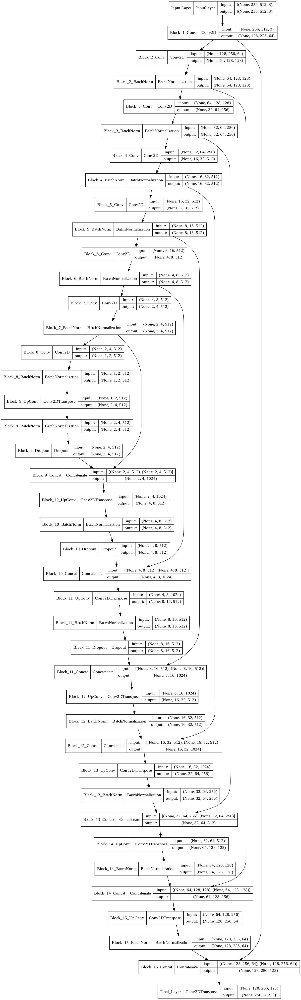

In [ ]:
generator = tf.keras.Model(x_in, B16)
tf.keras.utils.plot_model(generator, show_shapes=True, dpi = 128, to_file = 'Generator_U-Net.png')

##### Generator Loss Function
Generator loss is sigmoid cross entropy loss of generated images and an array of ones along with a L1 penalty that is mean absolute error between generated image and target image to maintain the structural similarity with a multiplier hyperparameter lambda.

As in every GAN network, Generator will minimize the error where Discriminator will learn the features to classify the generator output and real image. Here Discriminator output is ones when image is real image and zeros if the image is from generator. So, generator will try to make discriminators output as ones so a sigmoid cross entropy loss is used with all ones and discrimator generator output.

Overall loss becomes-

gan_loss+ LAMBDA * L1_loss.

Here LAMBDA is kept fixed at 100 as was described in the pix2pix paper.


In [ ]:
LAMBDA = 100

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

<a name="3.3.2"></a>
####3.3.2 Discriminator

#####Architecture

Discriminator recieves two inputs target image (Original Image) and generator output then concatenate these two inputs and uses Convolutional Neural Networks to classify the original image as ones and generator output as zeros.

Detailed architecture is displayed using keras.utils.plot_model

In [ ]:
initializer = tf.random_normal_initializer(0., 0.02)
inp = tf.keras.layers.Input(shape=[256, 512, 3], name='input_image')
tar = tf.keras.layers.Input(shape=[256, 512, 3], name='target_image')
# Concatenate input and target:
x = concatenate([inp, tar], name='Concatenate_input_target')
# Block-1:
B1 = Conv2D(64, kernel_size=4, strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name = 'Block_1_Conv') (x)
# Block-2:
B2 = Conv2D(128, kernel_size= 4,strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_2_Conv') (B1)
B2 = BatchNormalization(name = 'Block_2_BatchNorm') (B2)
# Block-3:
B3 = Conv2D(256, kernel_size = 4,strides=2, padding='same', use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_3_Conv') (B2)
B3 = BatchNormalization(name = 'Block_3_BatchNorm') (B3)
# Block-4:
B4 = ZeroPadding2D(name='Zero_pad_1') (B3)
# Block-5:
B5 = Conv2D(512, kernel_size = 4,strides=1, use_bias=False, kernel_initializer=initializer,activation='LeakyReLU', name= 'Block_5_Conv') (B4)
B5 = BatchNormalization(name = 'Block_5_BatchNorm') (B5)
# Block-6:
B6 = ZeroPadding2D(name='Zero_pad_2') (B5)
# Block-7:
last = Conv2D(1, kernel_size = 4,strides=1, kernel_initializer=initializer, name= 'Final_Layer') (B6)


##### Discriminator Model Visualization

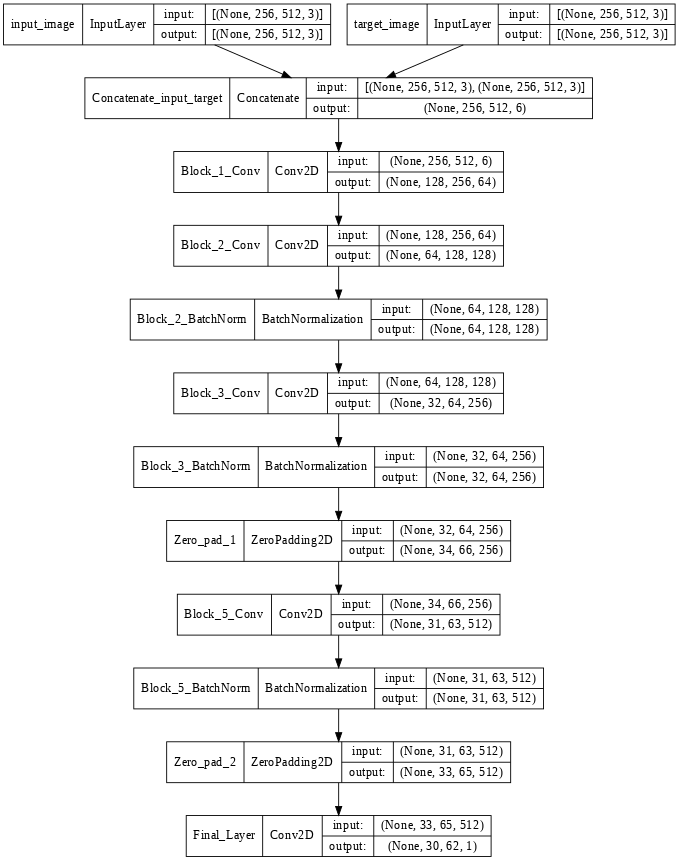

In [ ]:
discriminator = tf.keras.Model(inputs = [inp,tar],outputs=last)
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64, to_file = 'Discriminator_U-Net.png')

#####Discriminator Loss

This loss function takes two inputs- original image and generated image from generator. Here there are two losses being calculated-
1. Generator loss, that is binary cross entropy between discriminator generator output and all zeros of size discriminator generator output. (Discriminator Generator output: Output of discriminator with input as generator image and Input degraded image)
2. Real loss, that is binary cross entropy between discriminator output when input is original image and input degraded image (discriminator real output) and ones of size of discriminator real output

Final loss is the addition of both the losses.



In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

<a name="3.3.3"></a>
####3.3.3 Optimizer and checkpoint saver

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = '/content/drive/Shareddrives/EE610_Project/Models'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

<a name="3.3.4"></a>
#### 3.3.4 Generate Images

Define a function that takes generator model, test input target and displays the image

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

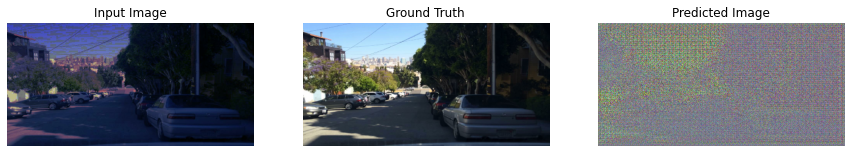

In [ ]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

<a name="3.3.5"></a>
#### 3.3.5 Training

For training the model, whole code is taken from [TensorFlow pix2pix tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix)

Steps followed in training-
1. Get generator output, discriminator generator output, discriminator real output. 
2. Find generator loss and discriminator loss.
3. Find gradients using tf.GradientTape()
4. Apply gradients to generator and discriminator 



In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))



#####Model.fit()
Again the fit function taken from [TensorFlow pix2pix tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix) and the overall idea is same take a batch of data from tensorflow dataset and train the model on that data then iterate to next batch and repeat for max iteration.


Here, we have only shown training for 10 epochs, but we have trained this model before and saved the same in google drive


In [ ]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 5000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 500 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step}")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 1000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

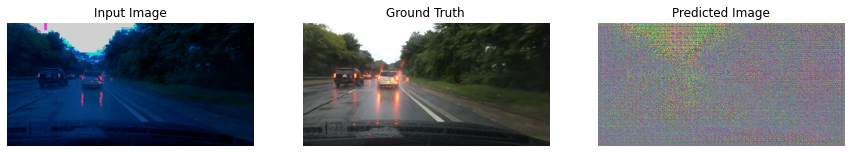

Step: 0
.

In [ ]:
fit(train_dataset, test_dataset, steps=10)
# generator.save('/content/drive/Shareddrives/EE610_Project/Models')

#### Load Model from checkpoint


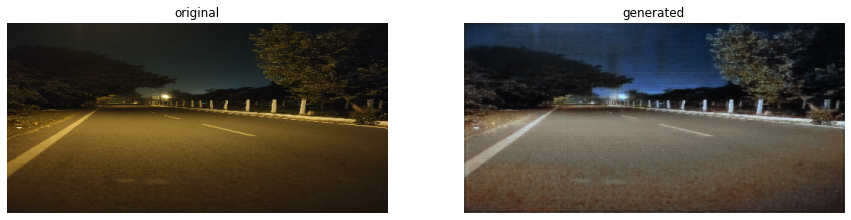

In [ ]:

model = tf.keras.models.load_model('/content/drive/Shareddrives/EE610_Project/Models')

pathh = '/content/drive/Shareddrives/EE610_Project/Data_Harsh/MicrosoftTeams-image.png'
example_input = tf.io.read_file(pathh)
example_input = tf.image.decode_jpeg(example_input)
example_input = tf.cast(example_input, tf.float32)
example_input,_ = resize(example_input,example_input,256,512)
example_input= tf.reshape(example_input/255,(1,256,512,3))
example_target= tf.reshape(re/255,(1,256,512,3))

prediction = model(example_input, training=True)
example_input = example_input.reshape(256,512,3)
prediction = prediction.reshape(256,512,3)
plt.subplot(1, 2, 1)
plt.title('original')
# Getting the pixel values in the [0, 1] range to plot.
plt.imshow(example_input)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.title('generated')
# Getting the pixel values in the [0, 1] range to plot.
plt.imshow(prediction*.5+.5)
plt.axis('off')
f = plt.gcf()
f.set_size_inches(15,30)
plt.show()

<a name="3.4"></a>
##3.4 VGG16 + Residual network

The model has architecture similar to UNET, except the fact that the encoder essentially consists of VGG 16 Pre trained model. As a result, we then concatenate and up sample the respective layers to get the decoder similar to a UNET and thus we get the following network architecture. It consists all the Convolutional layers of VGG16 and not the dense networks. The github link used for the code:

[github link](https://github.com/nikhilroxtomar/Semantic-Segmentation-Architecture)

The code was firstly understood after viewing the youtube video
[video link](https://www.youtube.com/watch?v=mgdB7WezqbU). Code was for segmentation but was used for the purpose of low light enhancement. Changes made : freezed the parameters first, but got better results after unfreezing them. Input dimensions were changed from the code to 224x224.

In [ ]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16

def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_vgg16_unet(input_shape):
    """ Input """
    inputs = Input(input_shape)

    """ Pre-trained VGG16 Model """
    vgg16 = VGG16(include_top=False, weights="imagenet", input_tensor=inputs)

    #if vgg16.trainable = False, we get transfer learning method where we fix the weights from ImageNet.
    #On training, the network worked better if we did not freeze the network.

    """ Encoder """
    s1 = vgg16.get_layer("block1_conv2").output         ## (512 x 512)
    s2 = vgg16.get_layer("block2_conv2").output         ## (256 x 256)
    s3 = vgg16.get_layer("block3_conv3").output         ## (128 x 128)
    s4 = vgg16.get_layer("block4_conv3").output         ## (64 x 64)

    """ Bridge """
    b1 = vgg16.get_layer("block5_conv3").output         ## (32 x 32)

    """ Decoder """
    d1 = decoder_block(b1, s4, 512)                     ## (64 x 64)
    d2 = decoder_block(d1, s3, 256)                     ## (128 x 128)
    d3 = decoder_block(d2, s2, 128)                     ## (256 x 256)
    d4 = decoder_block(d3, s1, 64)                      ## (512 x 512)

    #Here 64, 128, 512 etc represent the filter numbers in the network
    
    """ Output """
    outputs = Conv2D(3, 1, padding="same", activation="relu")(d4)

    model_vgg = Model(inputs, outputs, name="VGG16_U-Net")
    return model_vgg

if __name__ == "__main__":
    input_shape = (224, 224, 3) # Here we adjusted the input shape to be 224 x 224 
    model_vgg = build_vgg16_unet(input_shape)
    model_vgg.summary()

Model: "VGG16_U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 224, 224, 64  1792        ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 224, 224, 64  36928       ['block1_conv1[0][0]']           
                                )                                                       

Non trainable parameters are due to Batch Normalization.

### Architecture of VGG16 + Residual network

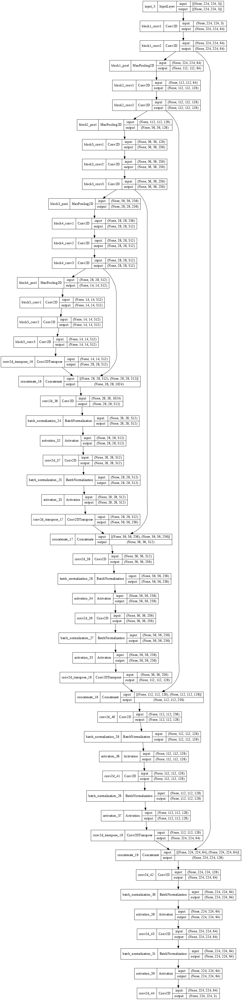

In [ ]:
tf.keras.utils.plot_model(model_vgg, show_shapes=True, dpi=64)

### Training and results

In [ ]:
model_vgg.compile(optimizer="adam",loss="mse")
model_vgg.fit(train_dataset,epochs=2)

Epoch 1/2
7009/7009 [==============================] - 282s 40ms/step - loss: 0.2591
Epoch 2/2
7009/7009 [==============================] - 280s 40ms/step - loss: 0.2528


In [ ]:
model_vgg.fit(train_dataset,epochs=5)

Epoch 1/5
7009/7009 [==============================] - 280s 40ms/step - loss: 0.2488
Epoch 2/5
7009/7009 [==============================] - 280s 40ms/step - loss: 0.2465
Epoch 3/5
7009/7009 [==============================] - 281s 40ms/step - loss: 0.2451
Epoch 4/5
7009/7009 [==============================] - 281s 40ms/step - loss: 0.2438
Epoch 5/5
7009/7009 [==============================] - 281s 40ms/step - loss: 0.2423


In [ ]:
model_vgg.evaluate(test_dataset)

2000/2000 [==============================] - 31s 14ms/step - loss: 0.2927


0.292728990316391

In [ ]:
model_vgg.save("/content/drive/Shareddrives/EE610_Project/Models/Nihar/Nihar_model_vgg.h5")

Extracting a random image from dataset and predicting the output for that image.

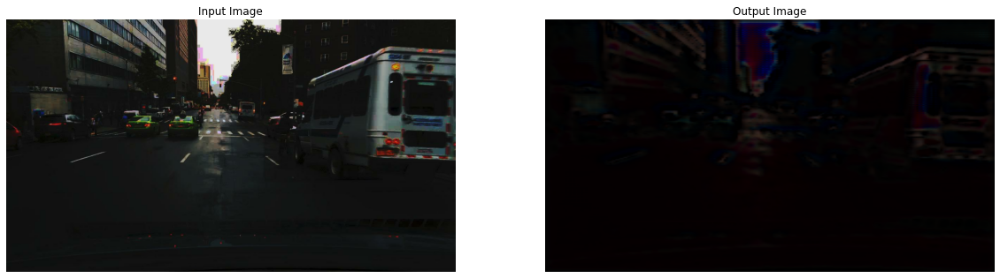

In [ ]:
img = tf.io.read_file(r"/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images_train/00a395fe-d60c0b47.jpg")
img = tf.image.decode_jpeg(img, channels=3)

resized_image_ip = tf.image.resize(img, [224, 224])

resized_image_ip = tf.cast(resized_image_ip,dtype=tf.float32)

resized_image_ip = tf.reshape(resized_image_ip,(1,224, 224,3))

model_vgg_2 = keras.models.load_model(r"/content/drive/Shareddrives/EE610_Project/Models/Nihar/Nihar_model_vgg.h5")

op_img = model_vgg_2.predict(resized_image_ip)

op_img = (tf.reshape(op_img,(224,224,3)))

op_img = (tf.image.resize(op_img, [img.shape[0],img.shape[1]]).numpy()).astype(np.uint16)

figure = plt.figure(figsize = (20,15))

figure.add_subplot(1,2,1)
plt.title("Input Image")
plt.axis("off")
plt.imshow(img)

figure.add_subplot(1,2,2)
plt.title("Output Image")
plt.axis("off")
plt.imshow(op_img)

plt.show()


As we can see, the output has slightly started to take on the day light colours. The original network was trained for 6 days with 6.6 million epochs to give best results, however, due to lack of computational power, we could train it only for 15 epochs.

<a name="4"></a>
##Results

###Function to load all the pretrained model and predict image


In [ ]:
def vgg_can(path):    
    img = tf.io.read_file(r"/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images_train/00a395fe-d60c0b47.jpg")
    img = tf.image.decode_jpeg(img, channels=3)
    resized_image_ip = tf.image.resize(img, [224, 224])
    resized_image_ip = tf.cast(resized_image_ip,dtype=tf.float32)
    resized_image_ip = tf.reshape(resized_image_ip,(1,224, 224,3))
    return resized_image_ip

    

In [ ]:
def u_net(pathh):
  model = tf.keras.models.load_model('/content/drive/Shareddrives/EE610_Project/Models/Harsh')

  example_input = tf.io.read_file(pathh)
  example_input = tf.image.decode_jpeg(example_input)
  example_input = tf.cast(example_input, tf.float32)
  example_input,_ = resize(example_input,example_input,256,512)
  example_input= tf.reshape(example_input/255,(1,256,512,3))
  prediction = model(example_input, training=True)
  example_input = example_input.reshape(256,512,3)
  prediction = prediction.reshape(256,512,3)
  prediction= prediction*.5+.5
  prediction= prediction.numpy()
  return np.uint8(np.minimum(255,np.maximum(0,prediction*255)))

In [ ]:
def pix2(pathh):
  model = tf.keras.models.load_model('/content/drive/Shareddrives/EE610_Project/Models')

  example_input = tf.io.read_file(pathh)
  example_input = tf.image.decode_jpeg(example_input)
  example_input = tf.cast(example_input, tf.float32)
  example_input,_ = resize(example_input,example_input,256,512)
  example_input= tf.reshape(example_input/255,(1,256,512,3))

  prediction = model(example_input, training=True)
  example_input = example_input.reshape(256,512,3)
  prediction = prediction.reshape(256,512,3)
  prediction= prediction*.5+.5
  prediction= prediction.numpy()
  return np.uint8(np.minimum(255,np.maximum(0,prediction*255)))

In [ ]:
def predict_all(deg_path):
  image_deg_conv = skimage.io.imread(deg_path)
  clahe = CLAHE(image_deg_conv)
  ssr = Display_img(image_deg_conv, sigma_list,sigma,count=0)
  msr = Display_img(image_deg_conv, sigma_list,sigma,count=1)
  msrcr = MSRCR(image_deg_conv, sigma_list, G,b,alpha,beta, low_clip, high_clip)
  msrcp = MSRCP(image_deg_conv, sigma_list, low_clip, high_clip)
  
  ip_vgg = vgg_can(deg_path)
  img = tf.io.read_file(deg_path)
  img = tf.image.decode_jpeg(img, channels=3)
  model_vgg = tf.keras.models.load_model(r"/content/drive/Shareddrives/EE610_Project/Models/Nihar/Nihar_model_vgg.h5")
  op_img_vgg = model_vgg.predict(ip_vgg)
  op_img_vgg = (tf.reshape(op_img_vgg,(224,224,3)))
  op_img_vgg = (tf.image.resize(op_img_vgg, [img.shape[0],img.shape[1]]).numpy()).astype(np.uint8)
  
  model_CAN = tf.keras.models.load_model(r"/content/drive/Shareddrives/EE610_Project/Models/Nihar/Nihar_model_224x224.h5")
  op_img_CAN = model_CAN.predict(ip_vgg)
  op_img_CAN = (tf.reshape(op_img_CAN,(224,224,3)))
  op_img_CAN = (tf.image.resize(op_img_CAN, [img.shape[0],img.shape[1]]).numpy()).astype(np.uint8)

  op_img_u_net = u_net(deg_path)
  op_img_pix2 = pix2(deg_path)

  return [clahe,ssr,msr,msrcr,msrcp,op_img_vgg,op_img_CAN,op_img_u_net, op_img_pix2]

In [ ]:
pathh = "/content/drive/Shareddrives/EE610_Project/Data/Degraded_Images_train/0af801e9-aa8d36ab.jpg"
img_list = predict_all(pathh)
inputt = skimage.io.imread(pathh)
target = skimage.io.imread('/content/drive/Shareddrives/EE610_Project/Data/Original_train/0af801e9-aa8d36ab.jpg')

###Function to show all the images

In [ ]:
def plott(img_list, inputt, target):
  figure = plt.figure(figsize=(30,20))
  figure = plt.subplot(4,3,1)
  plt.title("Input Degraded Image")
  plt.imshow(inputt)
  plt.axis("off")
  figure = plt.subplot(4,3,2)
  plt.title("Target Image")
  plt.imshow(target)
  plt.axis("off")
  figure = plt.subplot(4,3,3)
  plt.title("CLAHE")
  plt.imshow(img_list[0])
  plt.axis("off")
  figure = plt.subplot(4,3,4)
  plt.title("SSR")
  plt.imshow(img_list[1])
  plt.axis("off")
  figure = plt.subplot(4,3,5)
  plt.title("MSR")
  plt.imshow(img_list[2])
  plt.axis("off")
  figure = plt.subplot(4,3,6)
  plt.title("MSRCR")
  plt.imshow(img_list[3])
  plt.axis("off")
  figure = plt.subplot(4,3,7)
  plt.title("MSRCRP")
  plt.imshow(img_list[4])
  plt.axis("off")
  figure = plt.subplot(4,3,8)
  plt.title("VGG Output")
  plt.imshow(img_list[5])
  plt.axis("off")
  figure = plt.subplot(4,3,9)
  plt.title("CAN Output")
  plt.imshow(img_list[6])
  plt.axis("off")
  figure = plt.subplot(4,3,10)
  plt.title("U-Net Output")
  plt.imshow(img_list[7])
  plt.axis("off")
  figure = plt.subplot(4,3,11)
  plt.title("pix2pix Output")
  plt.imshow(img_list[8])
  plt.axis("off")
  plt.savefig('result-1')

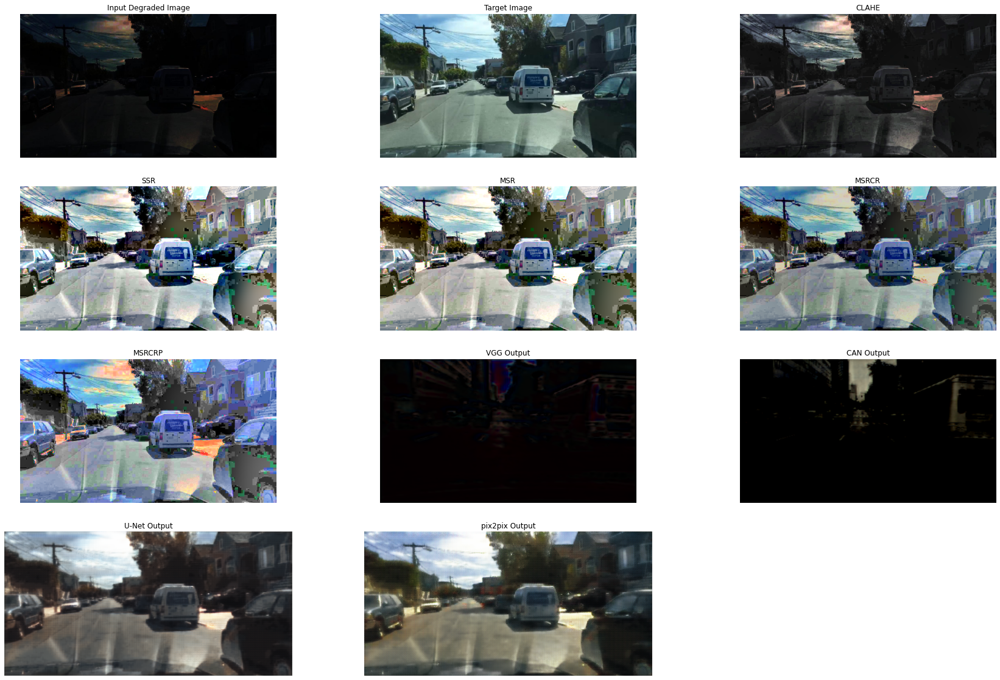

In [ ]:
plott(img_list, inputt, target)

### Function for Metrics

In [ ]:
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error

def metrics(true_img, pred_img):
  sim =  ssim(true_img,pred_img, multichannel= True)
  mse =  mean_squared_error(true_img,pred_img)
  psnr = skimage.metrics.peak_signal_noise_ratio(true_img,pred_img)
  return sim, mse, psnr

In [ ]:
clahe,ssr,msr,msrcr,msrcp,op_img_vgg,op_img_CAN,op_img_u_net, op_img_pix2
label = ['CLAHE', 'SSR', 'MSR', 'MSRCR', 'MSRCP', 'VGG', 'CAN', 'U-net', 'pix2pix']
for i, img in enumerate(img_list):
  print('SSIM: {:.2f}, MSE: {:.2f}, PSNR: {:.2f} for {}'.format(*metrics(skimage.transform.resize(target,(img.shape[0],img.shape[1])), img),label[i]))

SSIM: 0.00, MSE: 2775.88, PSNR: -34.43 for CLAHE
SSIM: 0.00, MSE: 23221.15, PSNR: -43.66 for SSR
SSIM: 0.00, MSE: 23276.26, PSNR: -43.67 for MSR
SSIM: 0.00, MSE: 14772.99, PSNR: -41.69 for MSRCR
SSIM: 0.00, MSE: 19322.60, PSNR: -42.86 for MSRCP
SSIM: 0.06, MSE: 64.04, PSNR: -18.06 for VGG
SSIM: 0.01, MSE: 408.77, PSNR: -26.11 for CAN
SSIM: 0.00, MSE: 10881.05, PSNR: -40.37 for U-net
SSIM: 0.00, MSE: 12406.30, PSNR: -40.94 for pix2pix


###Testing on Real Image

In [ ]:
def plott_real(img_list, inputt):
  figure = plt.figure(figsize=(30,20))
  figure = plt.subplot(5,2,1)
  plt.title("Input Real Image")
  plt.imshow(inputt)
  plt.axis("off")
  figure = plt.subplot(5,2,2)
  plt.title("CLAHE")
  plt.imshow(img_list[0])
  plt.axis("off")
  figure = plt.subplot(5,2,3)
  plt.title("SSR")
  plt.imshow(img_list[1])
  plt.axis("off")
  figure = plt.subplot(5,2,4)
  plt.title("MSR")
  plt.imshow(img_list[2])
  plt.axis("off")
  figure = plt.subplot(5,2,5)
  plt.title("MSRCR")
  plt.imshow(img_list[3])
  plt.axis("off")
  figure = plt.subplot(5,2,6)
  plt.title("MSRCRP")
  plt.imshow(img_list[4])
  plt.axis("off")
  figure = plt.subplot(5,2,7)
  plt.title("VGG Output")
  plt.imshow(img_list[5])
  plt.axis("off")
  figure = plt.subplot(5,2,8)
  plt.title("CAN Output")
  plt.imshow(img_list[6])
  plt.axis("off")
  figure = plt.subplot(5,2,9)
  plt.title("U-Net Output")
  plt.imshow(img_list[7])
  plt.axis("off")
  figure = plt.subplot(5,2,10)
  plt.title("pix2pix Output")
  plt.imshow(img_list[8])
  plt.axis("off")
  plt.savefig('result-1')

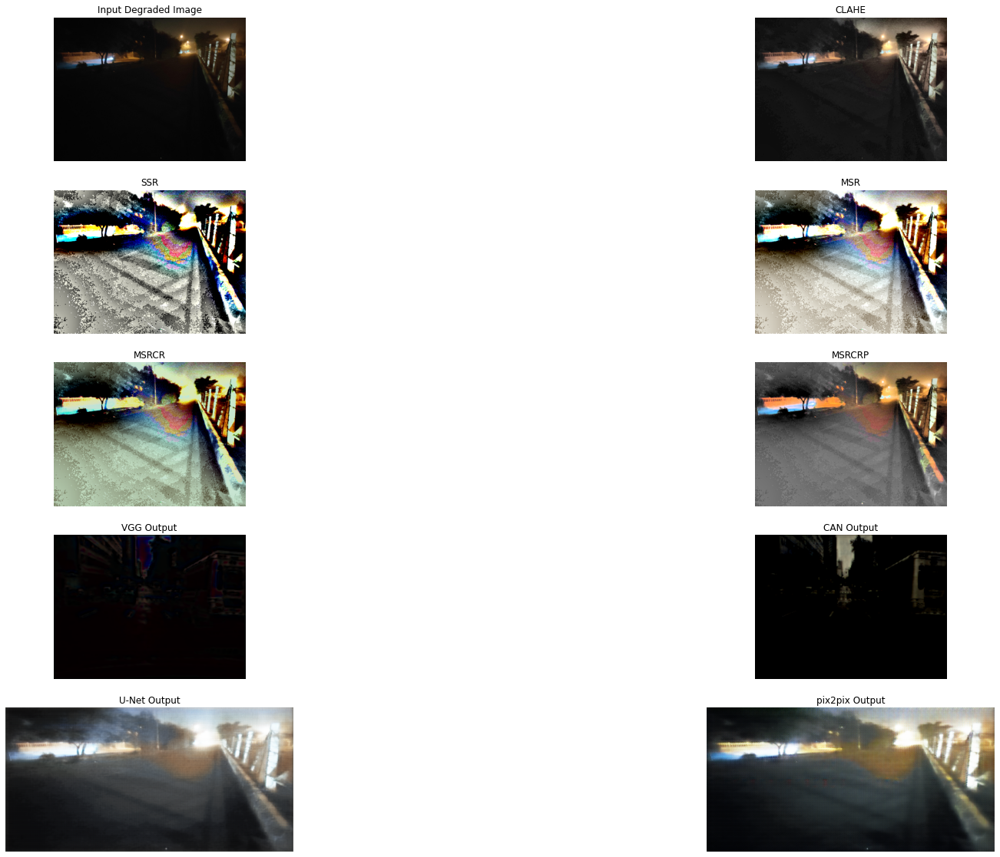

In [ ]:
pathh = "/content/drive/Shareddrives/EE610_Project/Data_Harsh/MicrosoftTeams-image (18).png"
img_list = predict_all(pathh)
inputt = skimage.io.imread(pathh)
plott_real(img_list, inputt)

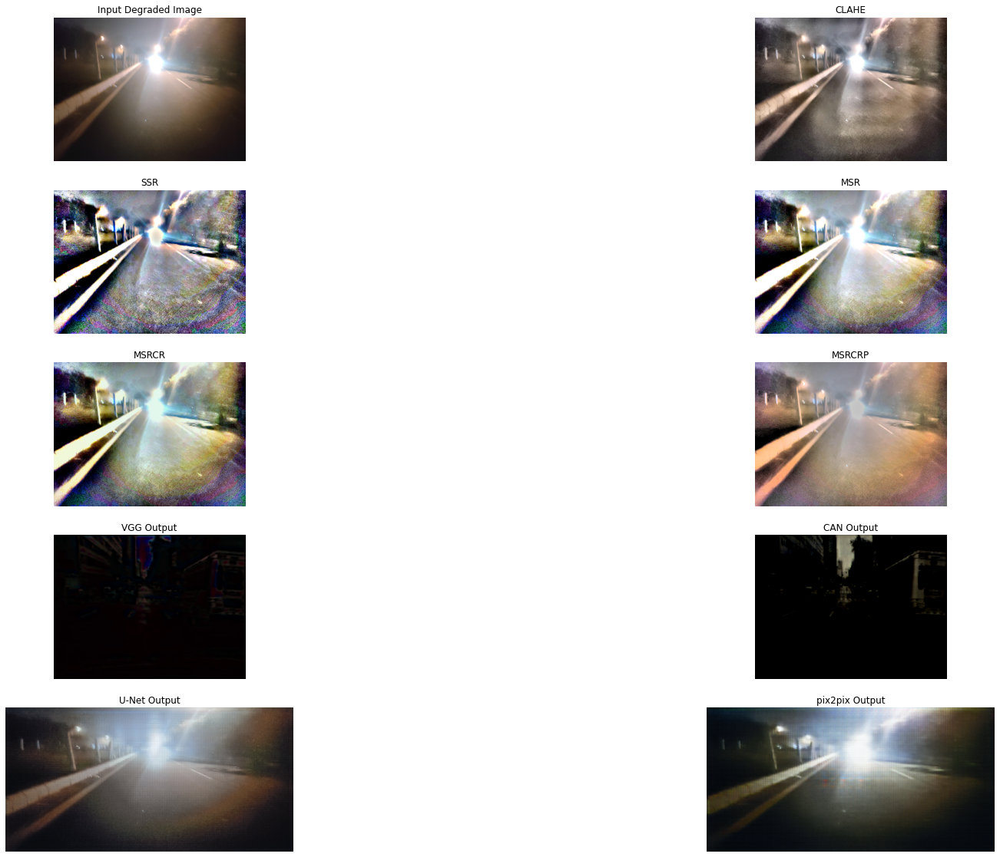

In [ ]:
pathh = "/content/drive/Shareddrives/EE610_Project/Data_Harsh/MicrosoftTeams-image (19).png"
img_list = predict_all(pathh)
inputt = skimage.io.imread(pathh)
plott_real(img_list, inputt)